In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/industrial-alarm-monitoring-dataset-2018-2024/preprocessed_trendedpointalarm 1.csv


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

df = pd.read_csv(r"/kaggle/input/industrial-alarm-monitoring-dataset-2018-2024/preprocessed_trendedpointalarm 1.csv")
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


In [3]:
df.dtypes

DateTime              object
ProcessID             object
AssetID               object
AlarmSeverityName     object
State                 object
TransactionMessage    object
Stage                 object
AlarmClassName        object
Year                   int64
Month                  int64
Day                    int64
DayOfWeek             object
Season                object
Hour                   int64
ProcessedMessage      object
dtype: object

In [4]:
# Check for null values
null_values = df.isnull().sum()

# Display the count of null values in each column
print("Null values in each column:")
print(null_values)

Null values in each column:
DateTime                 0
ProcessID                0
AssetID                271
AlarmSeverityName        0
State                    0
TransactionMessage     594
Stage                 2984
AlarmClassName           0
Year                     0
Month                    0
Day                      0
DayOfWeek                0
Season                   0
Hour                     0
ProcessedMessage       594
dtype: int64


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102319 entries, 0 to 102318
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   DateTime            102319 non-null  object
 1   ProcessID           102319 non-null  object
 2   AssetID             102048 non-null  object
 3   AlarmSeverityName   102319 non-null  object
 4   State               102319 non-null  object
 5   TransactionMessage  101725 non-null  object
 6   Stage               99335 non-null   object
 7   AlarmClassName      102319 non-null  object
 8   Year                102319 non-null  int64 
 9   Month               102319 non-null  int64 
 10  Day                 102319 non-null  int64 
 11  DayOfWeek           102319 non-null  object
 12  Season              102319 non-null  object
 13  Hour                102319 non-null  int64 
 14  ProcessedMessage    101725 non-null  object
dtypes: int64(4), object(11)
memory usage: 11.7+ MB


In [6]:
df.describe()

,Year,Month,Day,Hour
count,102319.000000,102319.000000,102319.000000,102319.000000
mean,2021.547699,6.604287,15.899862,11.559847
std,1.808214,3.304413,8.749062,6.857471
min,2015.000000,1.000000,1.000000,0.000000
25%,2021.000000,4.000000,8.000000,6.000000
50%,2022.000000,6.000000,16.000000,12.000000
75%,2023.000000,10.000000,24.000000,17.000000
max,2024.000000,12.000000,31.000000,23.000000


In [7]:
# Remove rows with null values
df = df.dropna()

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98850 entries, 0 to 102318
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   DateTime            98850 non-null  object
 1   ProcessID           98850 non-null  object
 2   AssetID             98850 non-null  object
 3   AlarmSeverityName   98850 non-null  object
 4   State               98850 non-null  object
 5   TransactionMessage  98850 non-null  object
 6   Stage               98850 non-null  object
 7   AlarmClassName      98850 non-null  object
 8   Year                98850 non-null  int64 
 9   Month               98850 non-null  int64 
 10  Day                 98850 non-null  int64 
 11  DayOfWeek           98850 non-null  object
 12  Season              98850 non-null  object
 13  Hour                98850 non-null  int64 
 14  ProcessedMessage    98850 non-null  object
dtypes: int64(4), object(11)
memory usage: 12.1+ MB


 
#  Univariate Analysis:
Count Plots: For categorical columns like AlarmSeverityName, State, Stage, DayOfWeek, Season, AlarmClassName.<br>
Histograms: For numerical columns like Year, Month, Day, Hour 

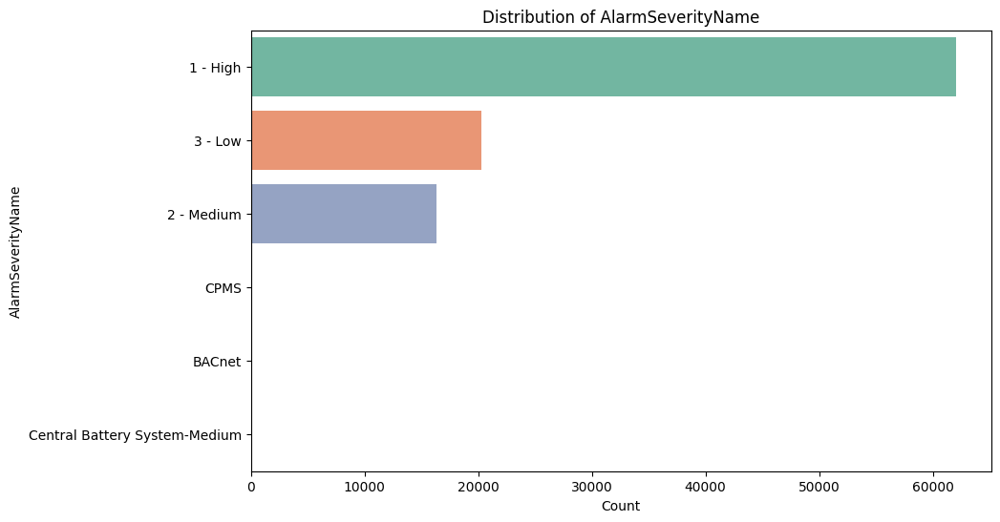

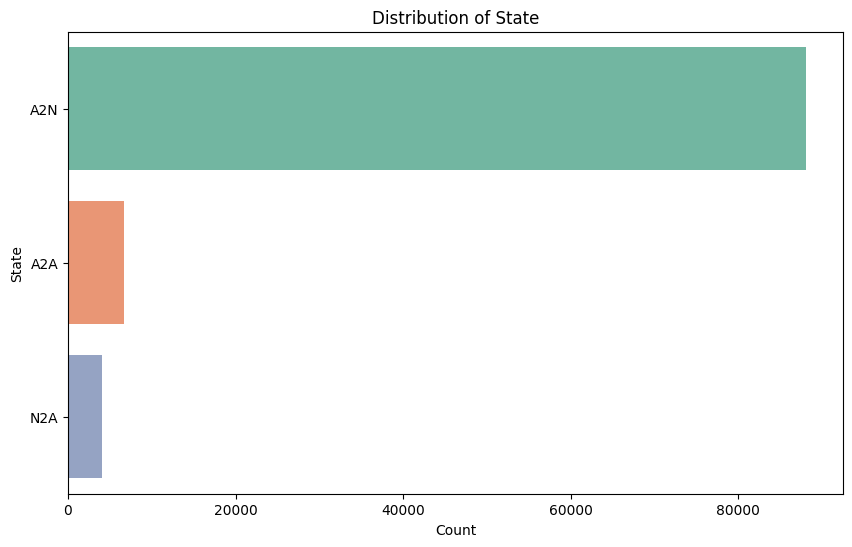

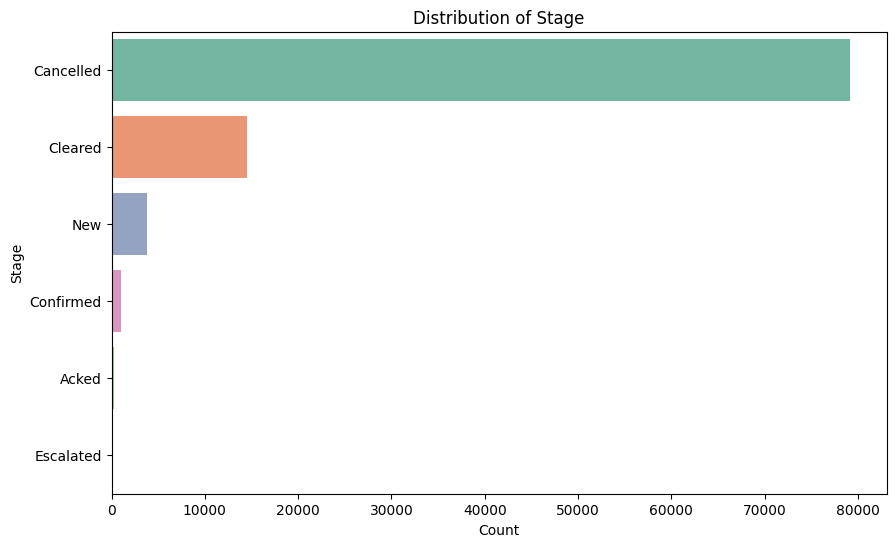

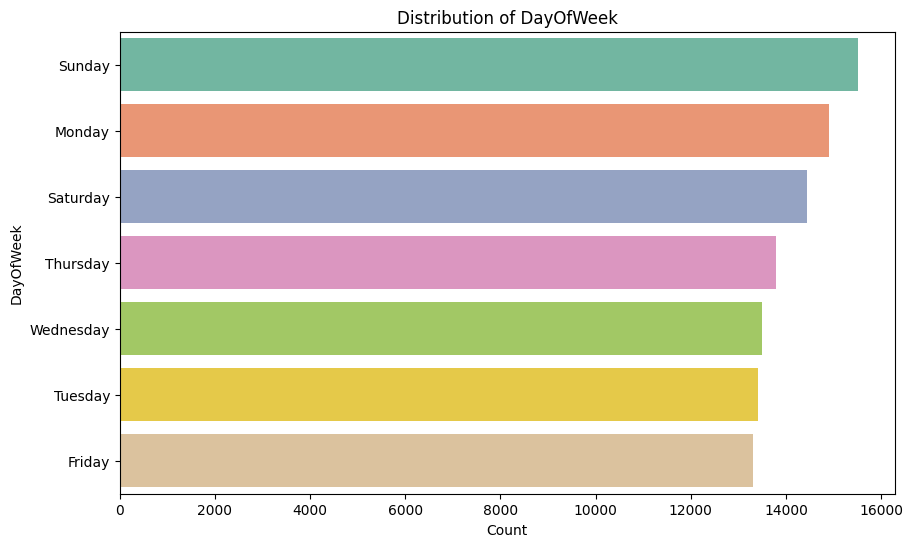

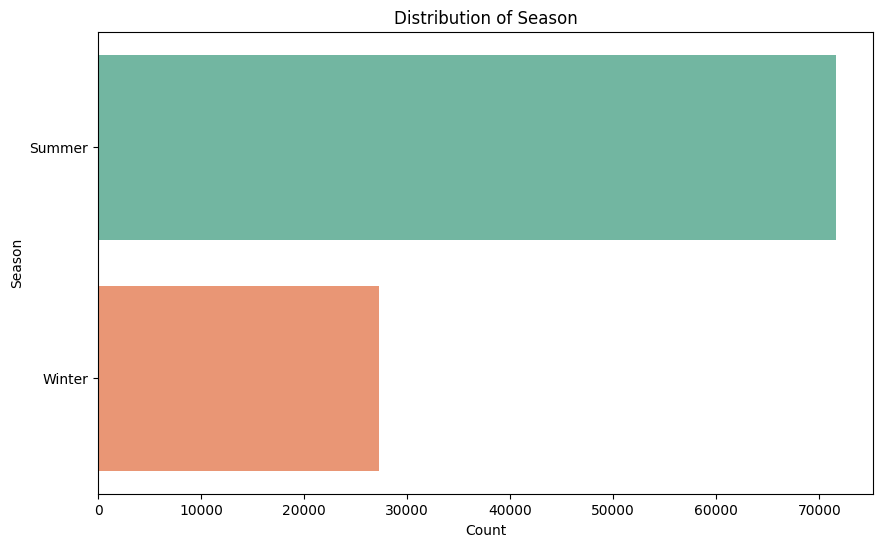

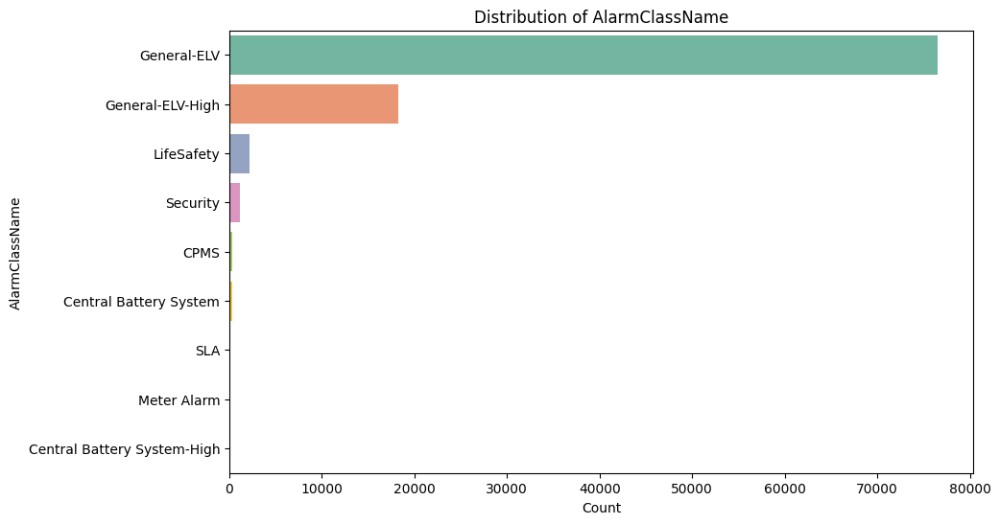

In [10]:
categorical_columns = ['AlarmSeverityName', 'State', 'Stage', 'DayOfWeek', 'Season', 'AlarmClassName']
for col in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette='Set2')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()


In [11]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


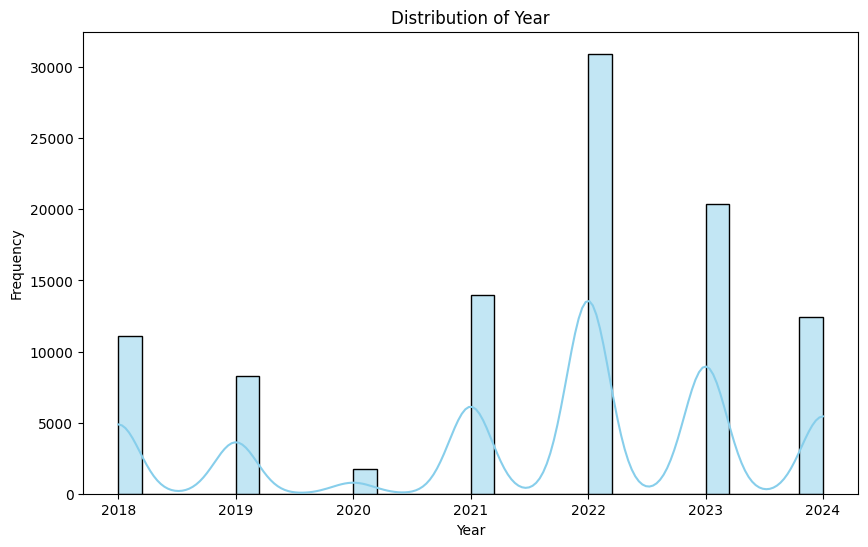

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


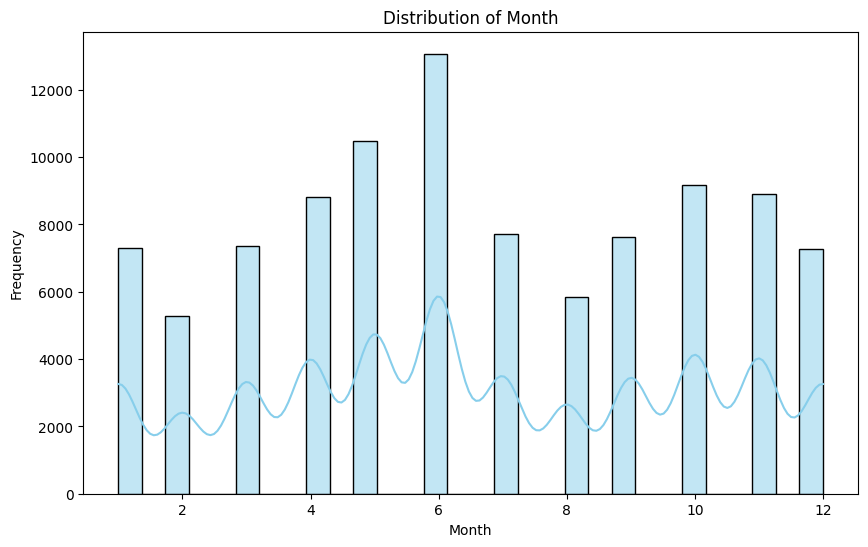

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


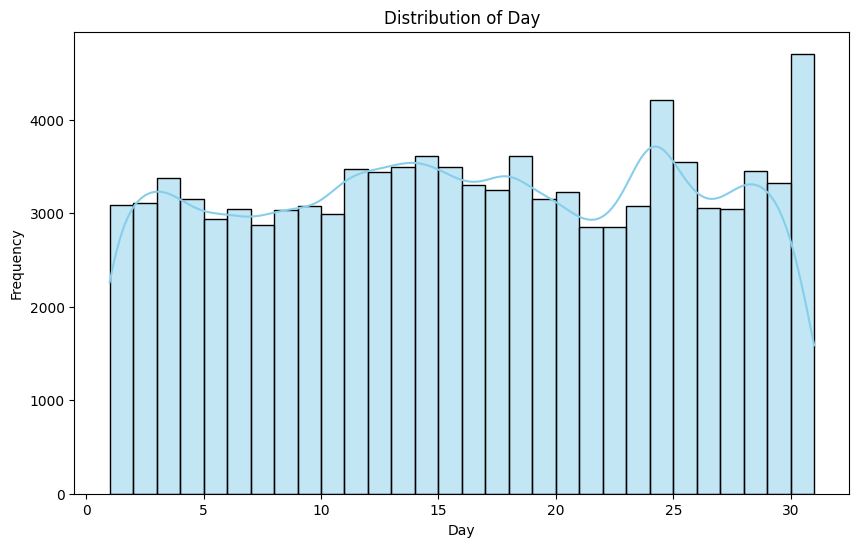

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


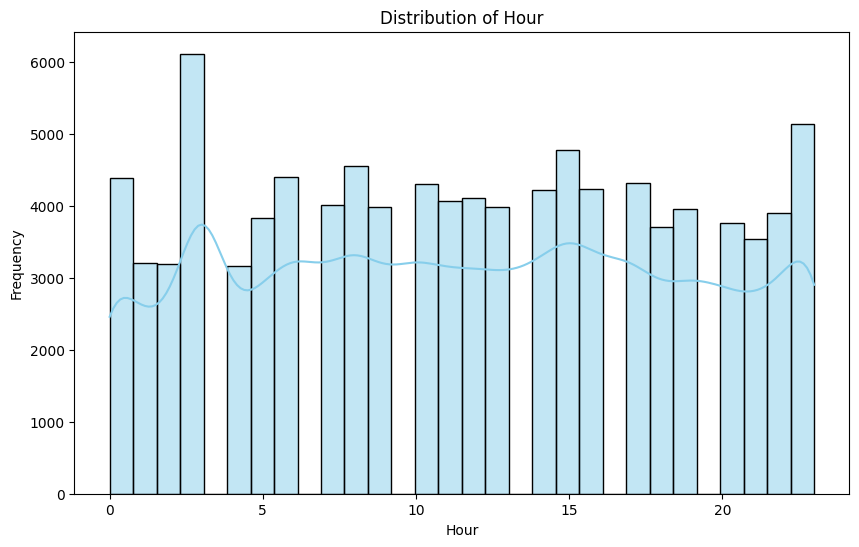

In [12]:
numerical_columns = ['Year', 'Month', 'Day', 'Hour']
for col in numerical_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df[col], bins=30, kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


In [13]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


# Bivariate Analysis
Heatmaps<br>
Bar Plots<br>
Scatter Plots<br>
Box Plots<br>
Pairwise Comparisons<br>
Line Plots


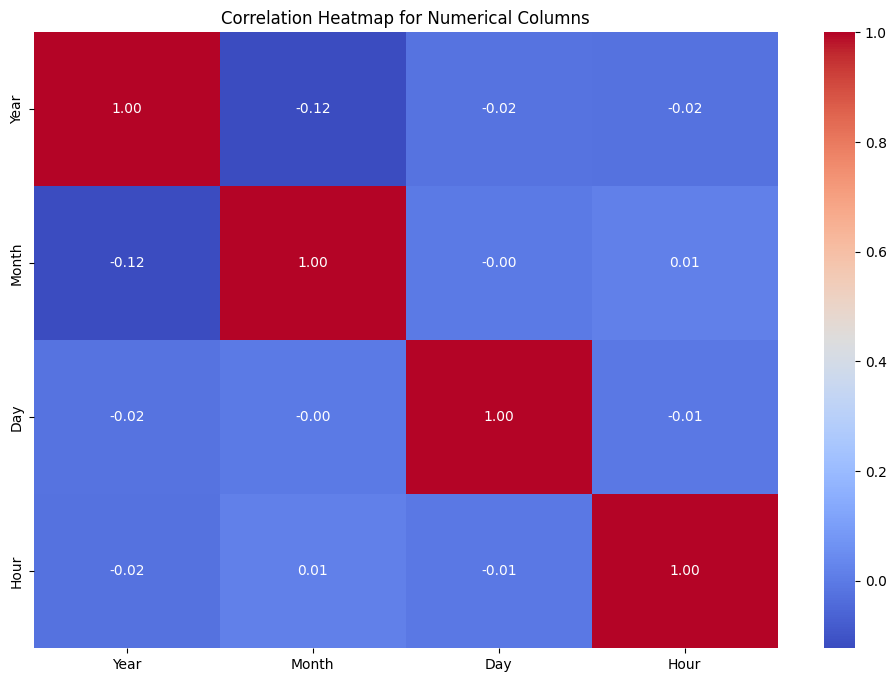

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numerical columns
numerical_columns = ['Year', 'Month', 'Day', 'Hour']   
numerical_df = df[numerical_columns]

# Compute the correlation matrix
correlation_matrix = numerical_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap for Numerical Columns')
plt.show()


In [15]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


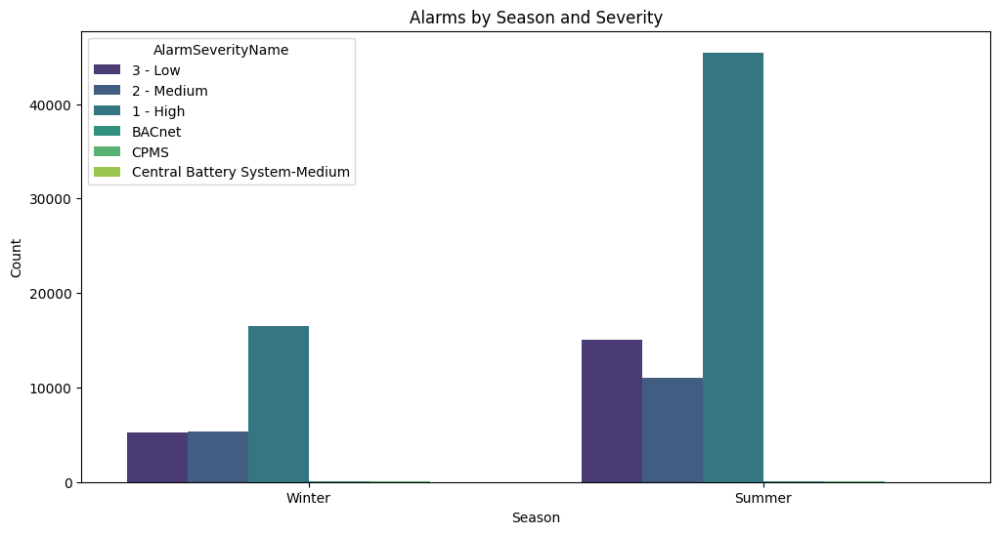

In [16]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Season', hue='AlarmSeverityName', data=df, palette='viridis')
plt.title('Alarms by Season and Severity')
plt.xlabel('Season')
plt.ylabel('Count')
plt.show()


In [17]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


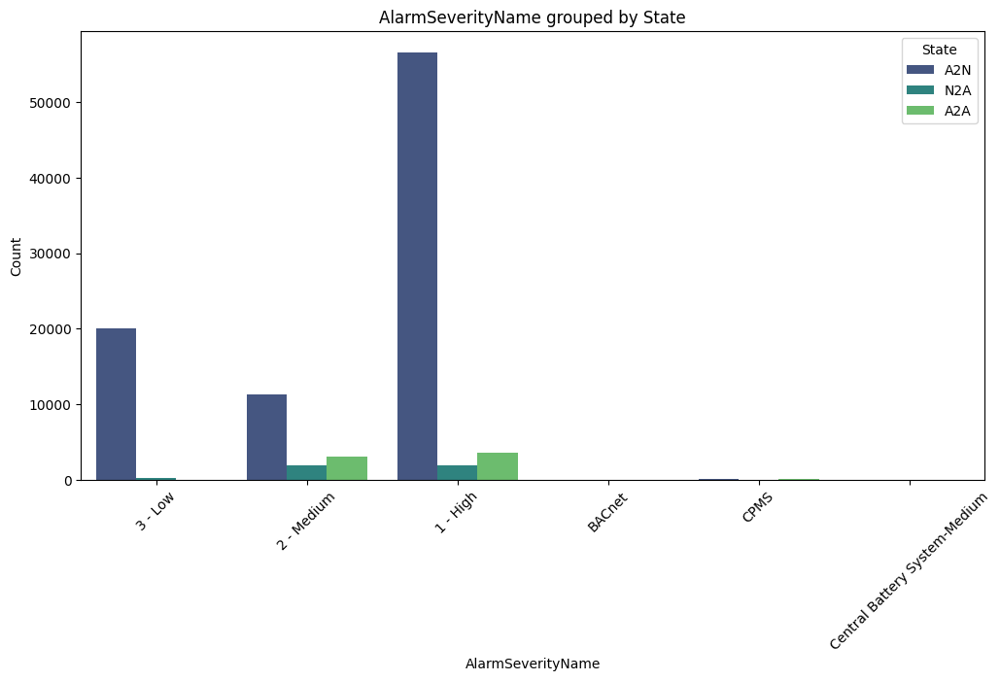

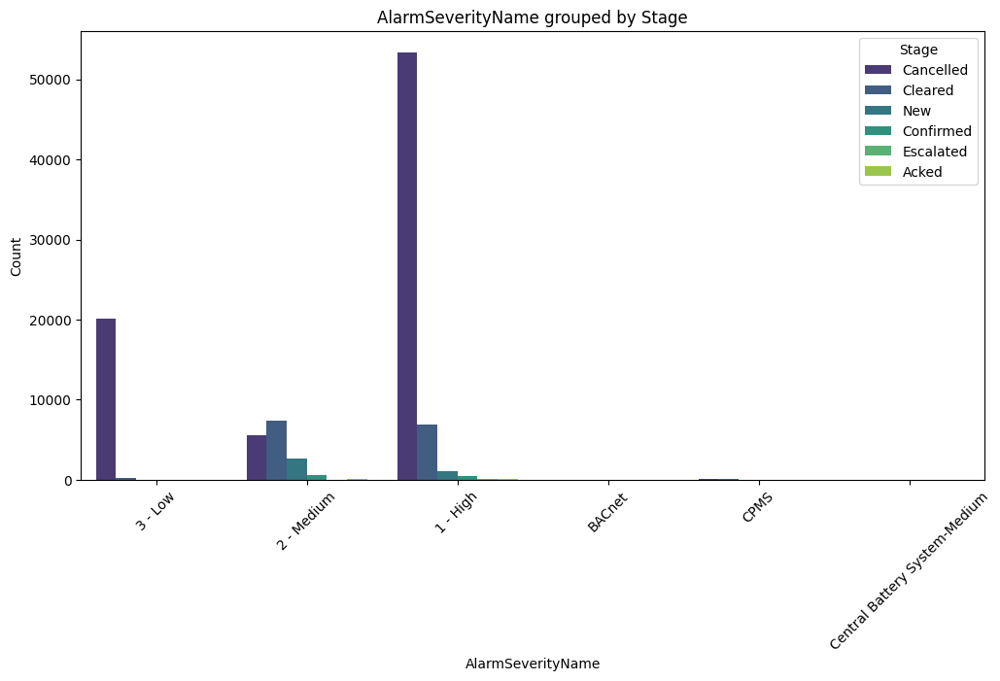

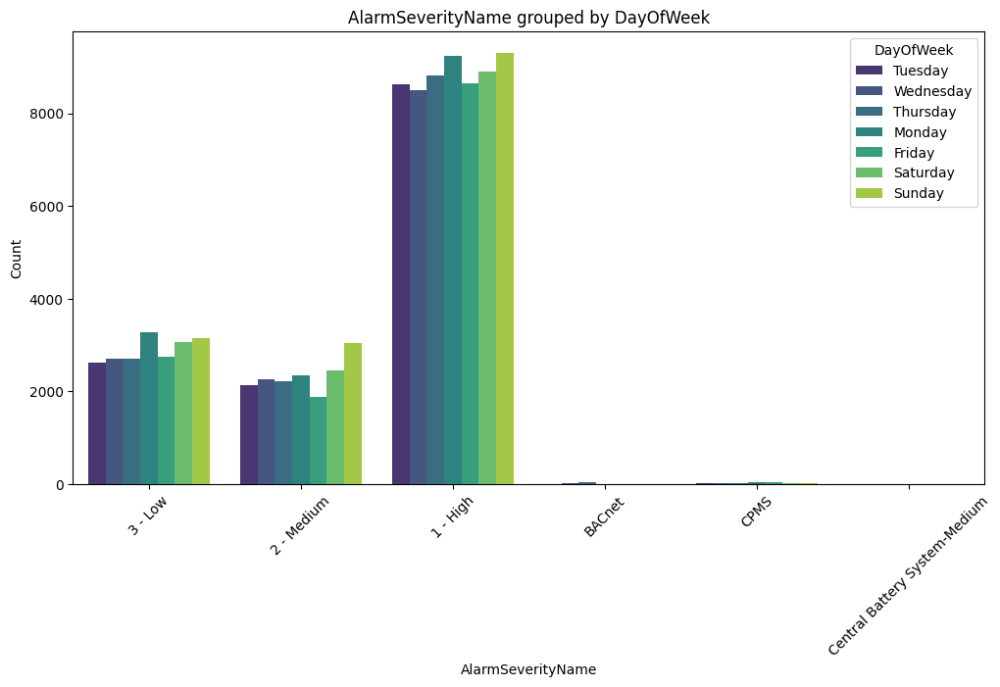

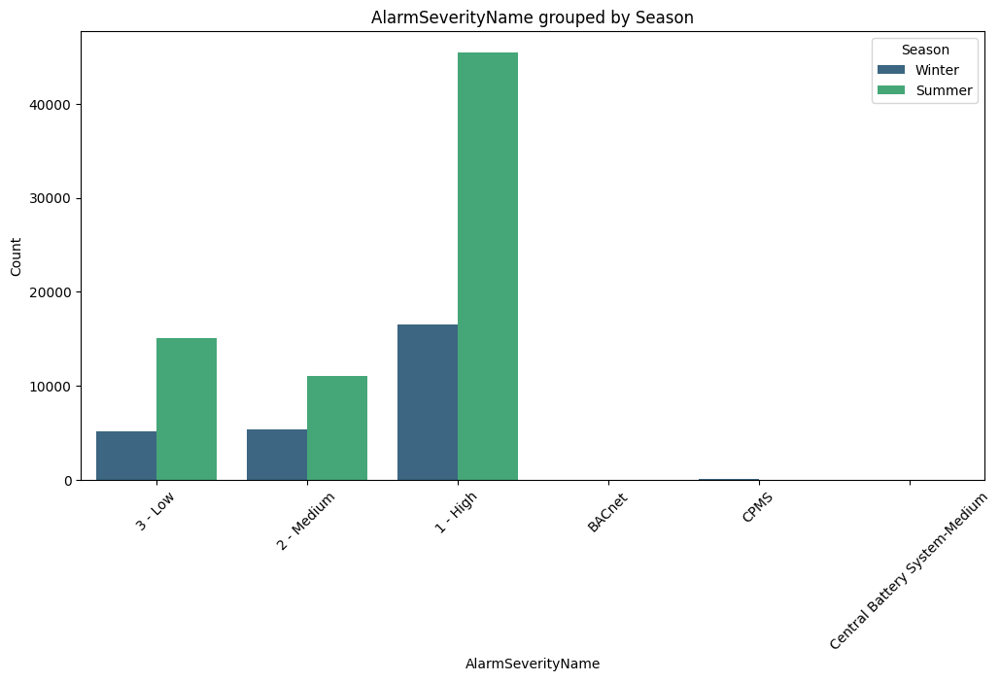

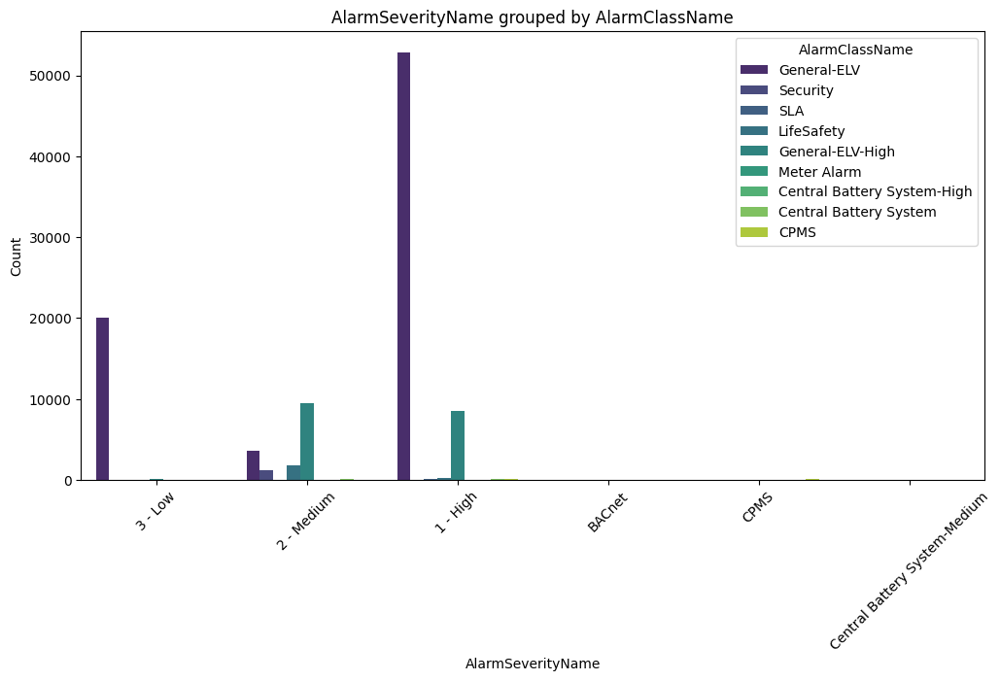

...

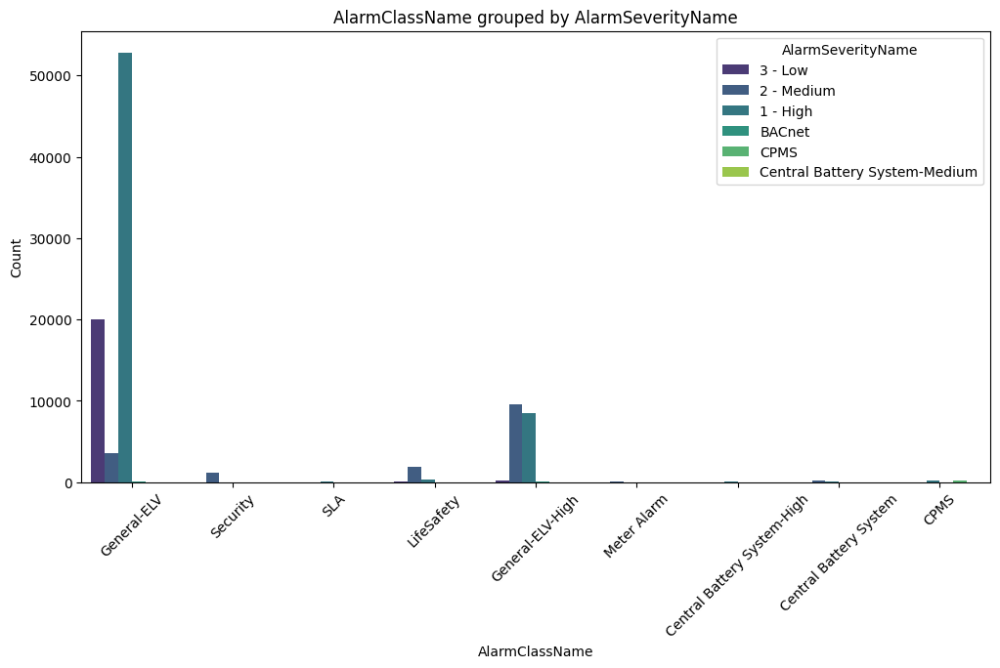

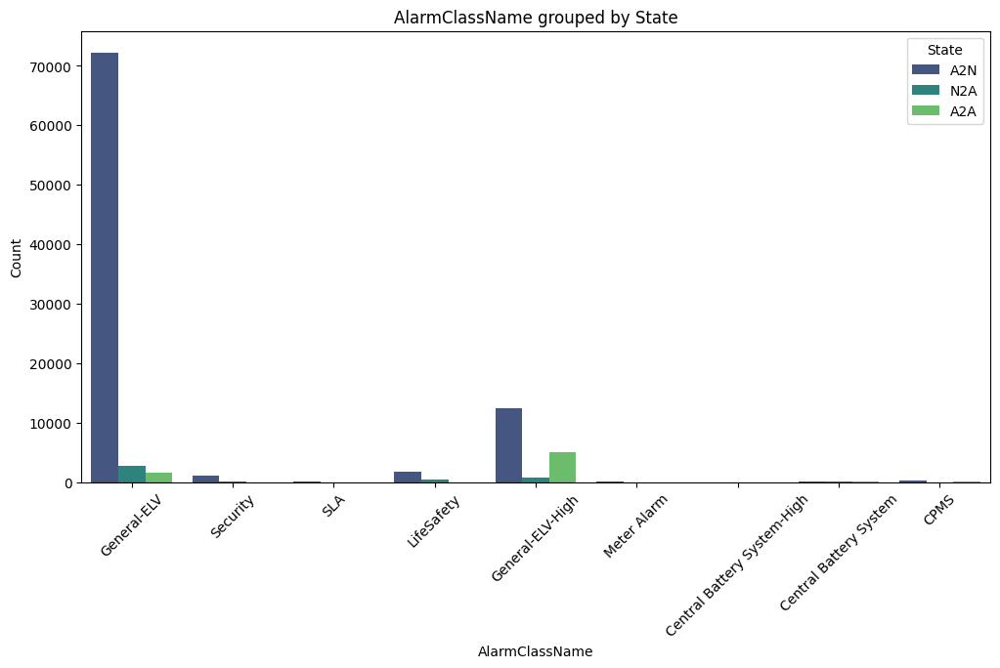

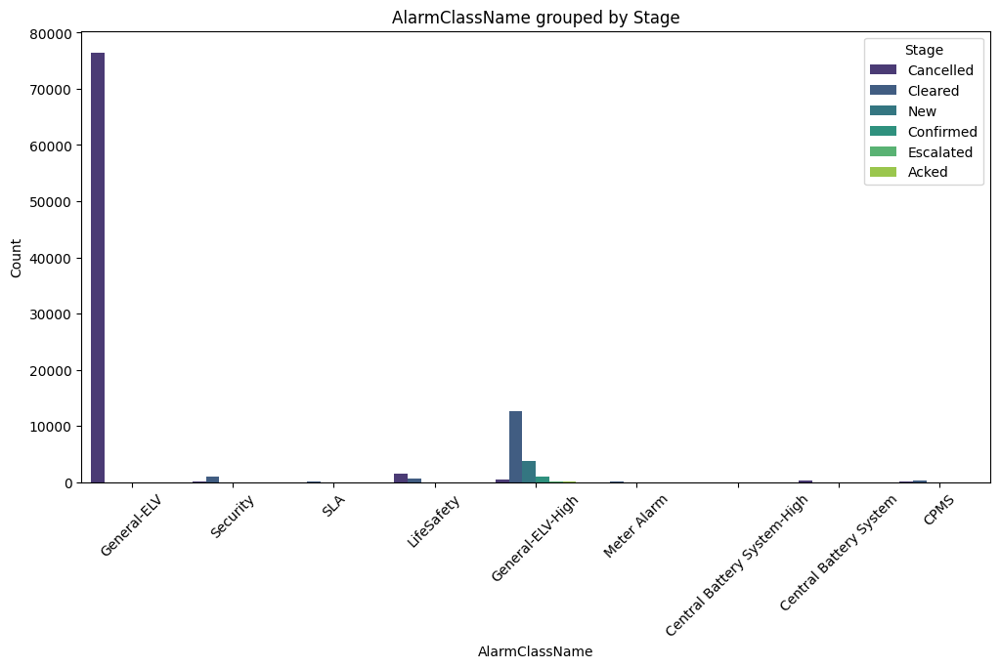

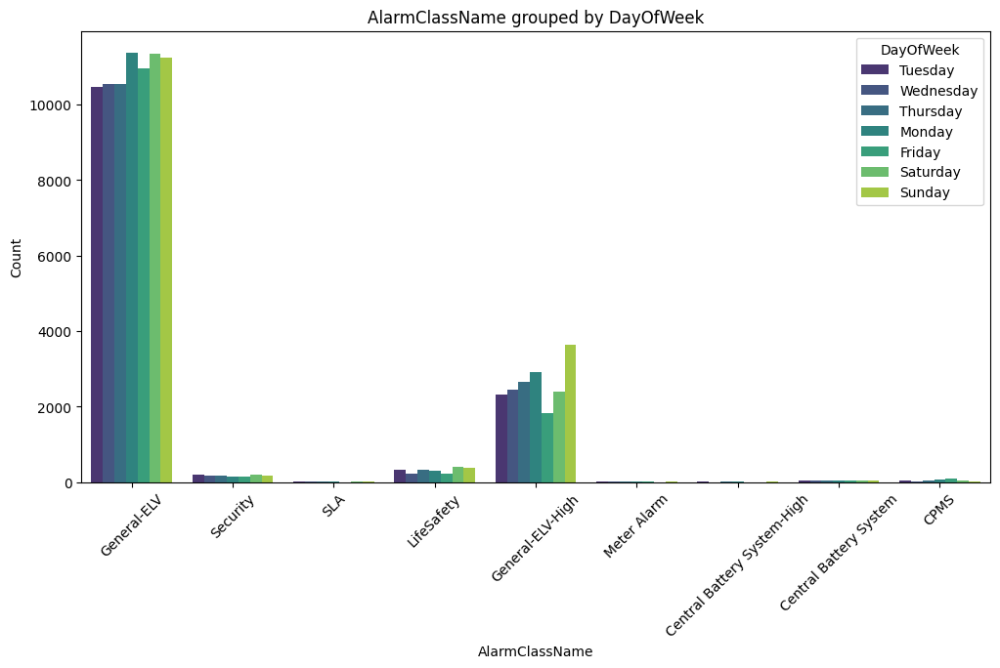

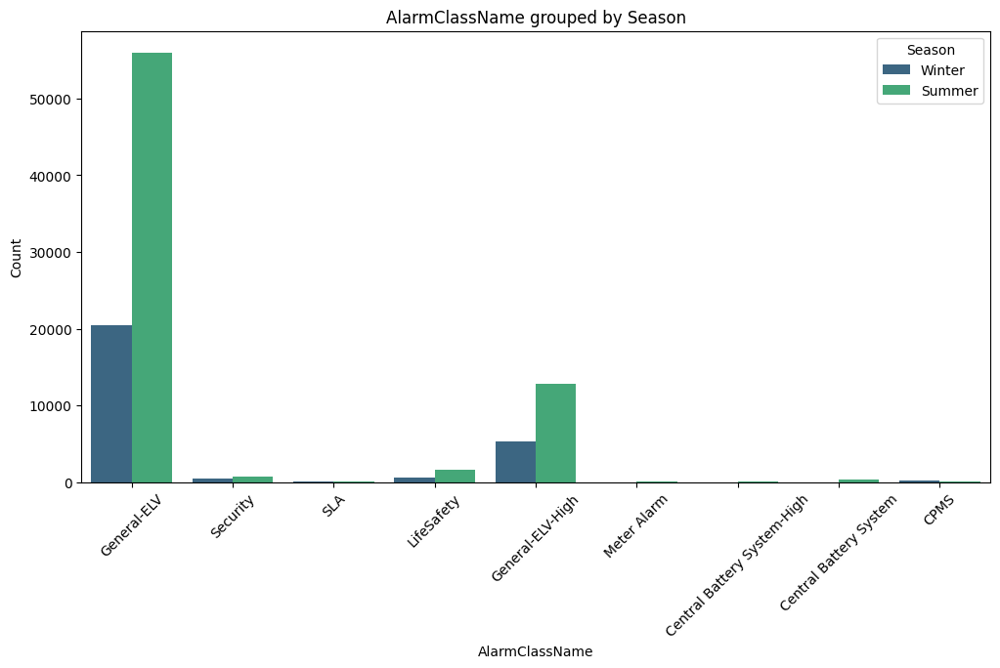

In [18]:
# Pairwise combinations of categorical columns
for col1 in categorical_columns:
    for col2 in categorical_columns:
        if col1 != col2:
            plt.figure(figsize=(12, 6))
            sns.countplot(x=col1, hue=col2, data=df, palette='viridis')
            plt.title(f'{col1} grouped by {col2}')
            plt.xlabel(col1)
            plt.ylabel('Count')
            plt.legend(title=col2)
            plt.xticks(rotation=45)
            plt.show()


In [19]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


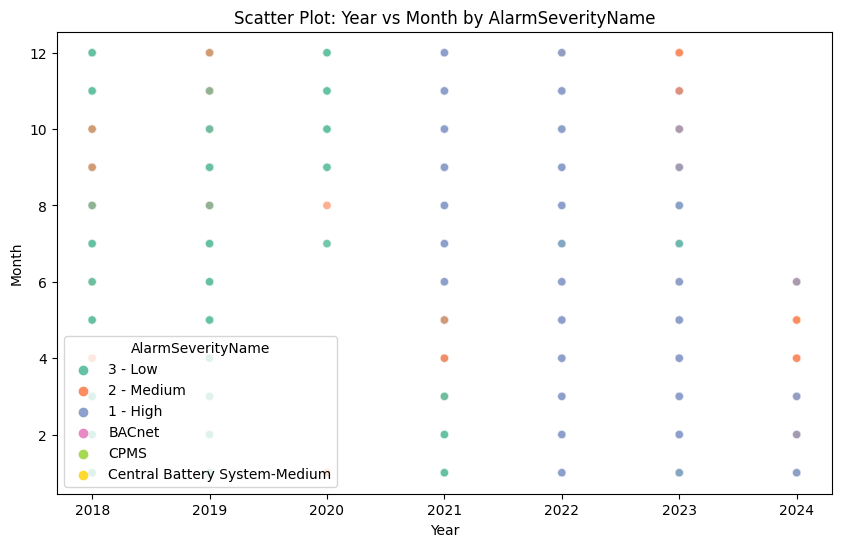

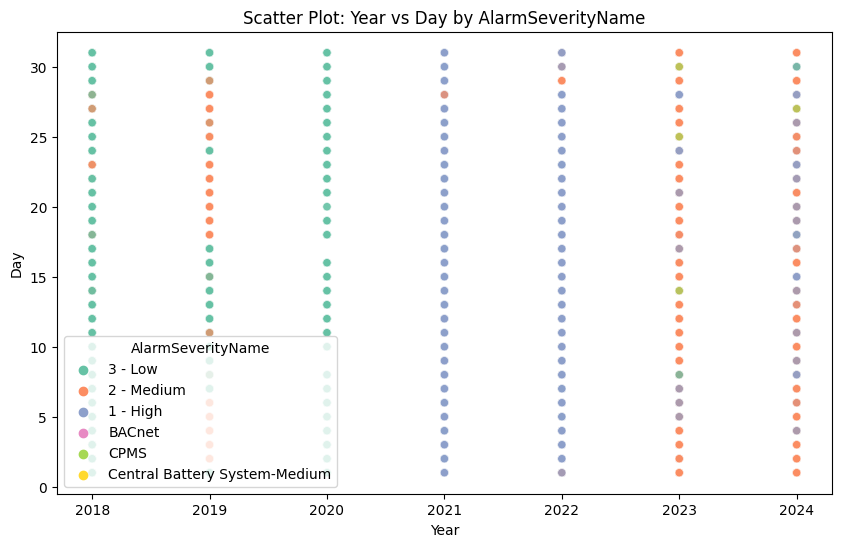

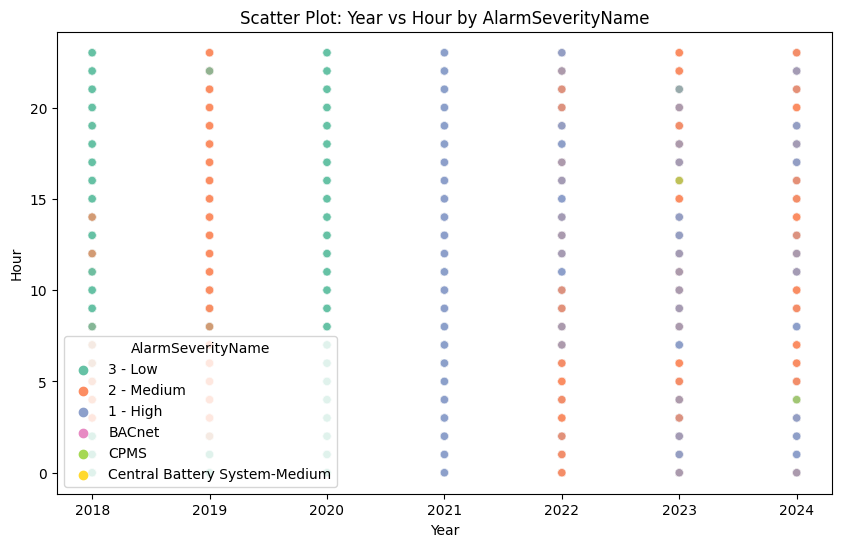

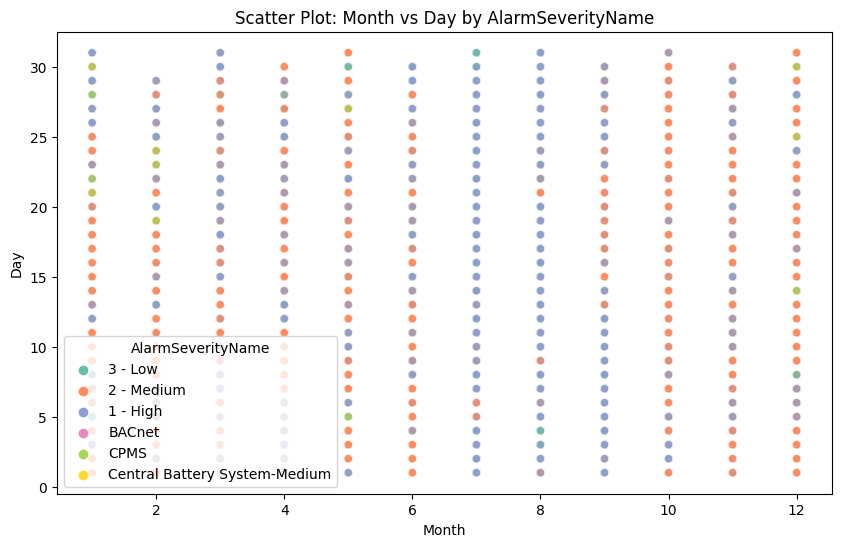

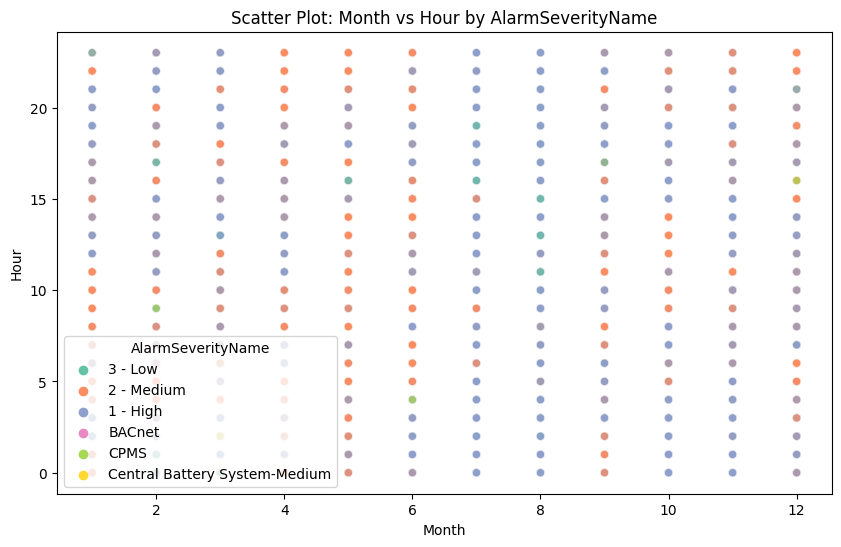

...

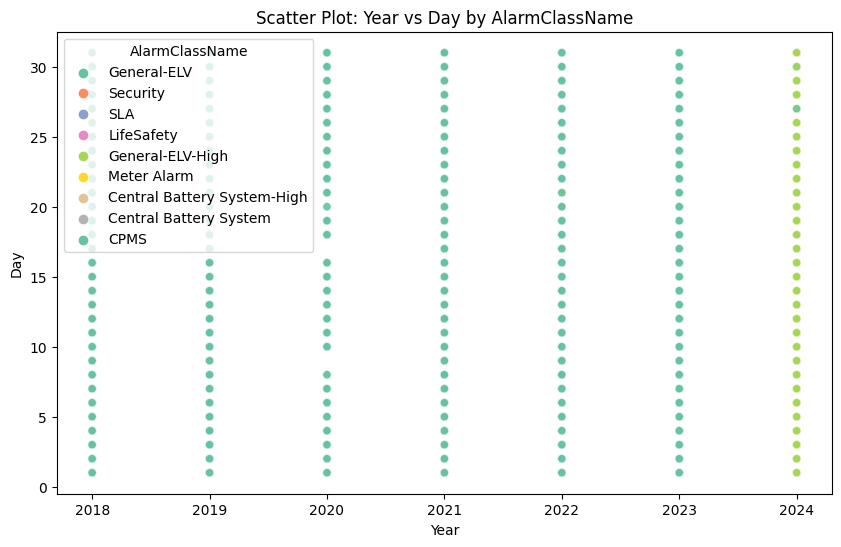

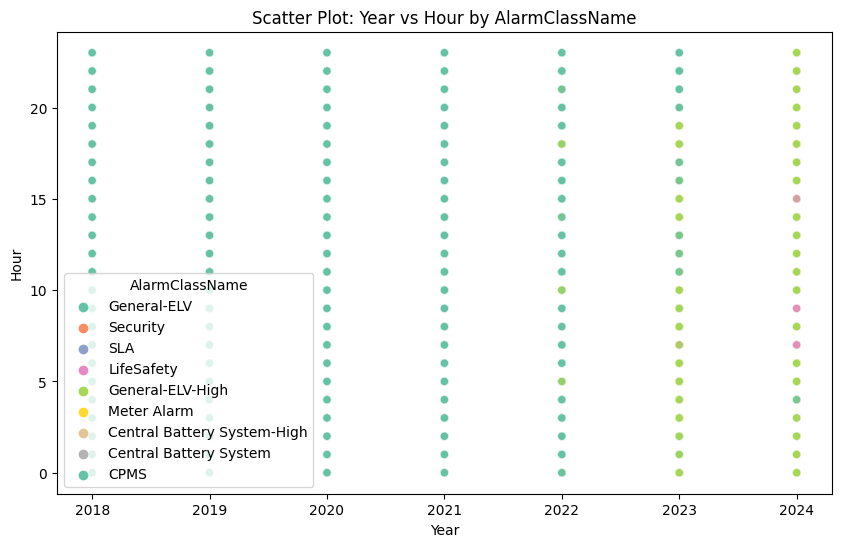

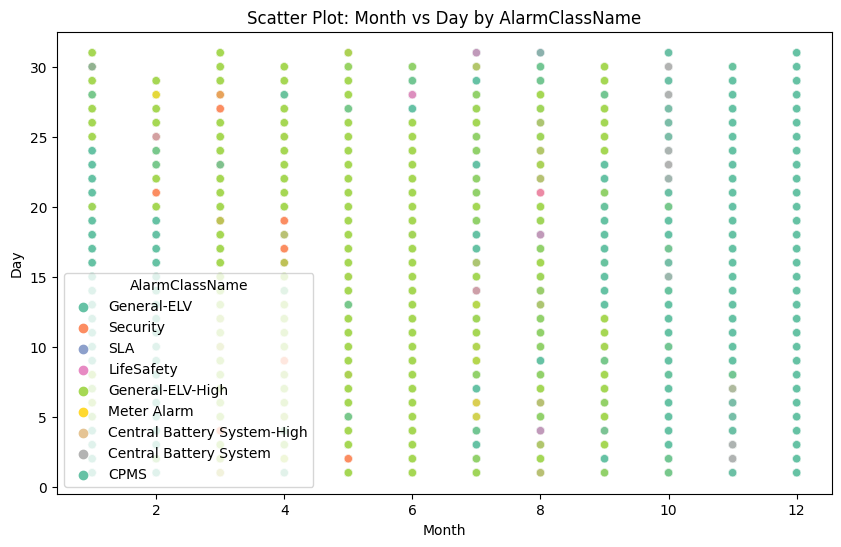

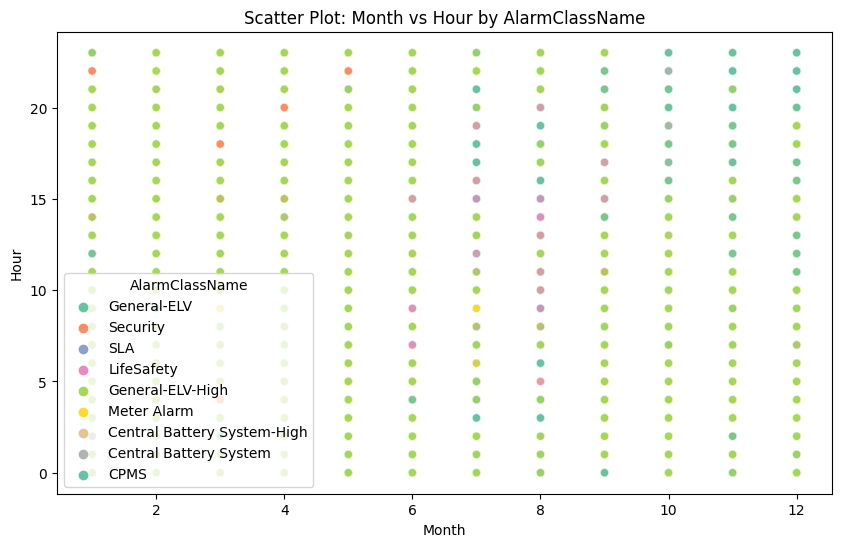

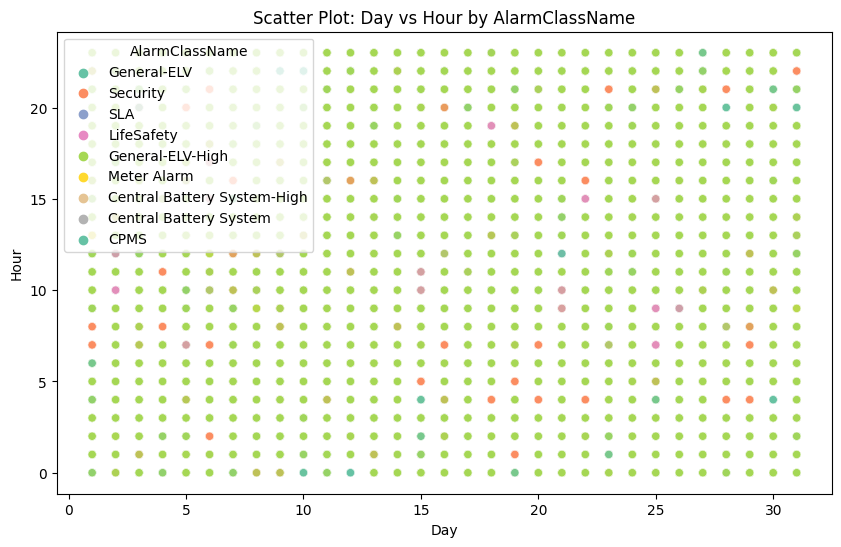

In [20]:
# List of categorical columns
categorical_columns = ['AlarmSeverityName', 'State', 'Stage', 'DayOfWeek', 'Season', 'AlarmClassName']

# Generate scatter plots with hue
for cat_col in categorical_columns:
    for i, col1 in enumerate(numerical_columns):
        for col2 in numerical_columns[i + 1:]:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=col1, y=col2, hue=cat_col, data=df, alpha=0.7, palette='Set2')
            plt.title(f'Scatter Plot: {col1} vs {col2} by {cat_col}')
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.legend(title=cat_col)
            plt.show()


In [21]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


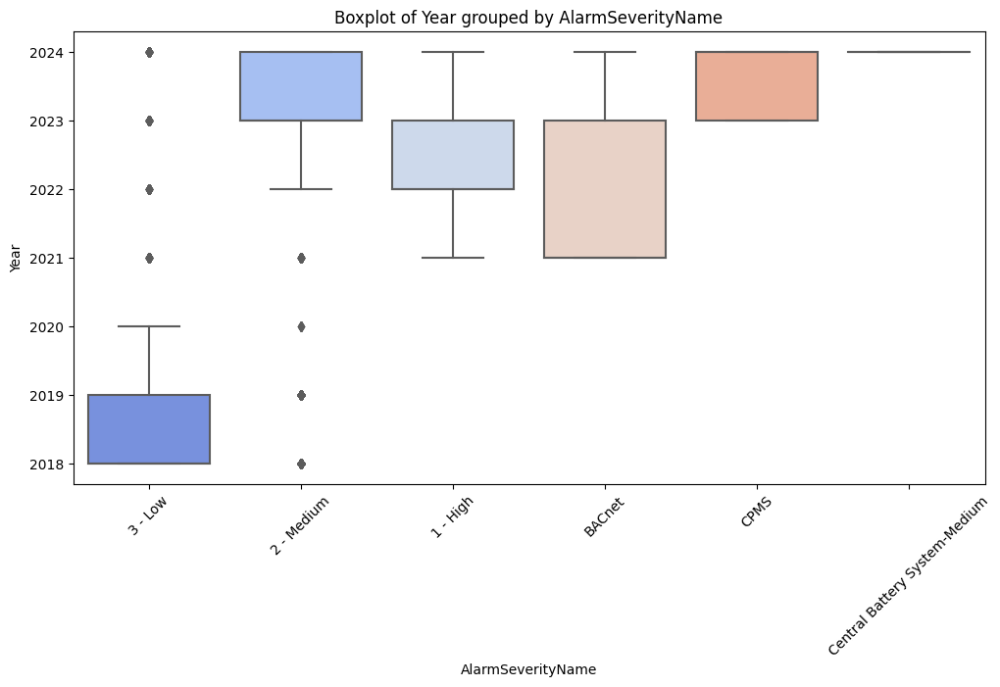

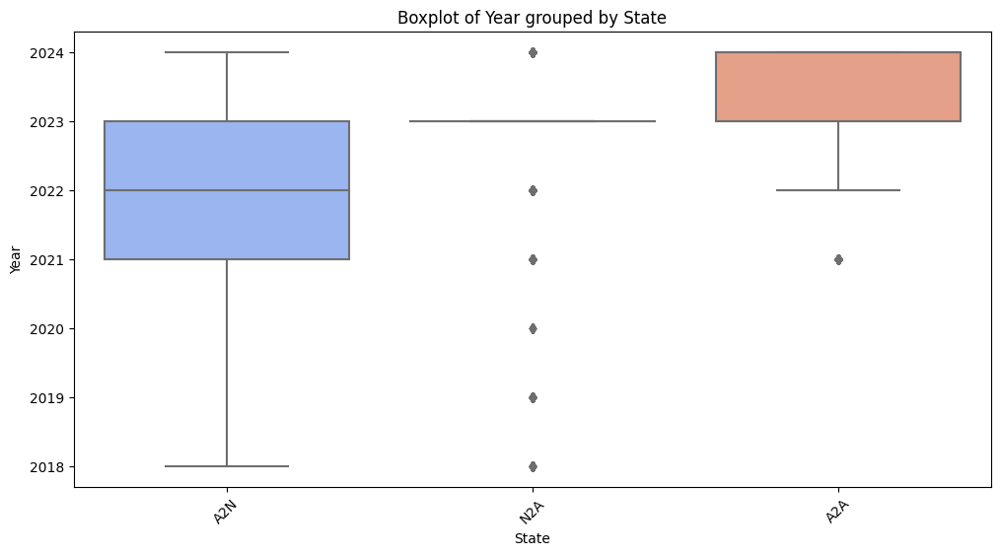

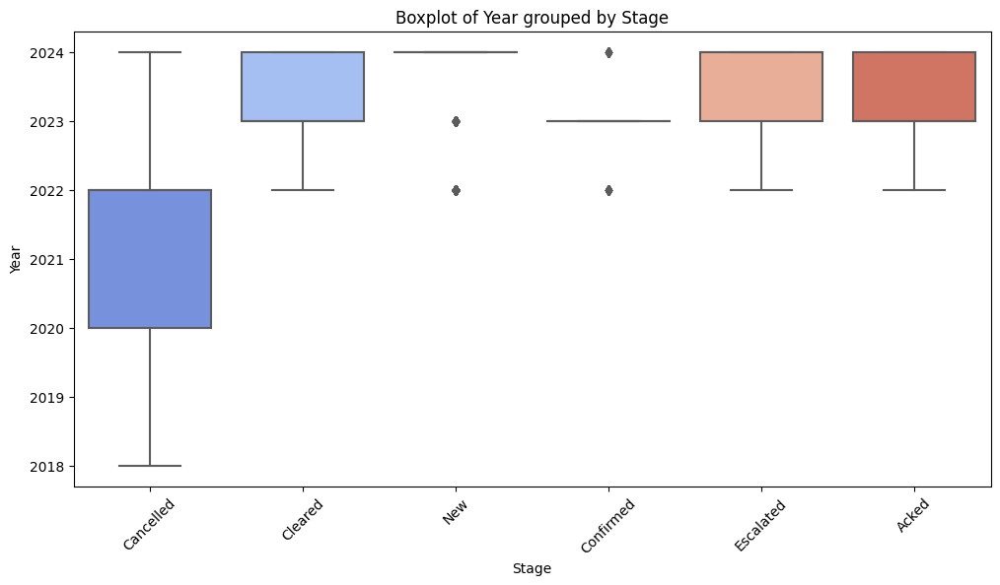

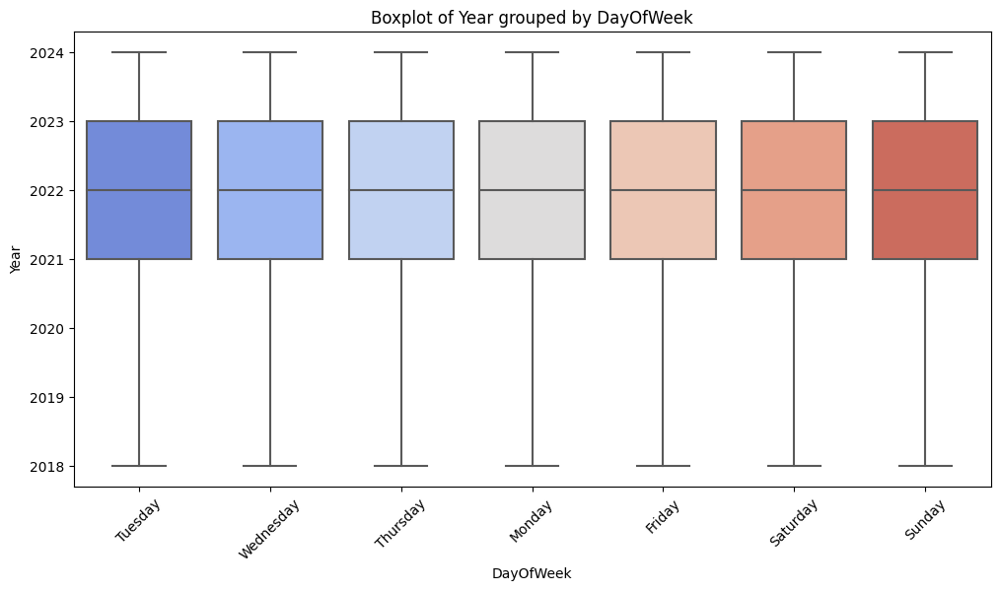

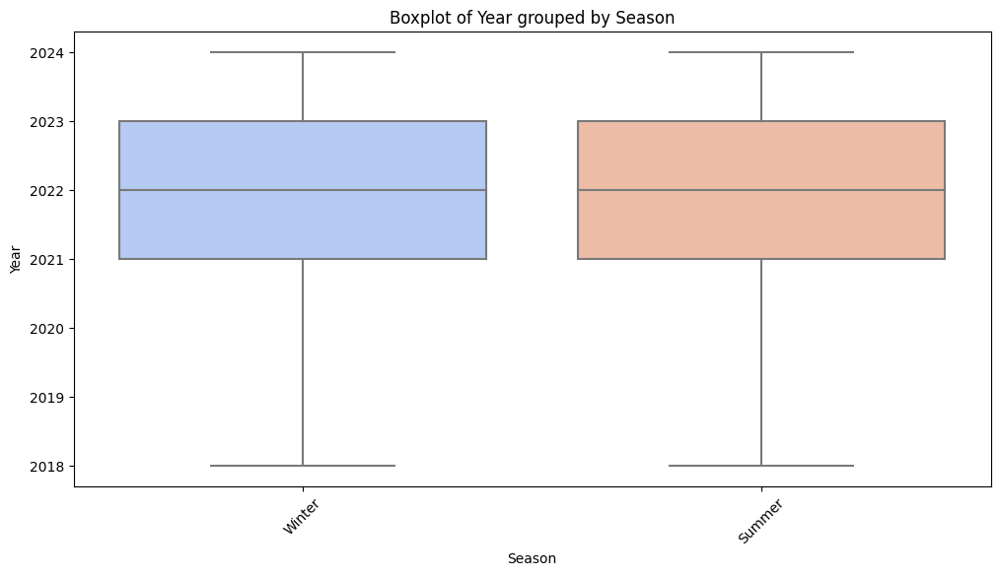

...

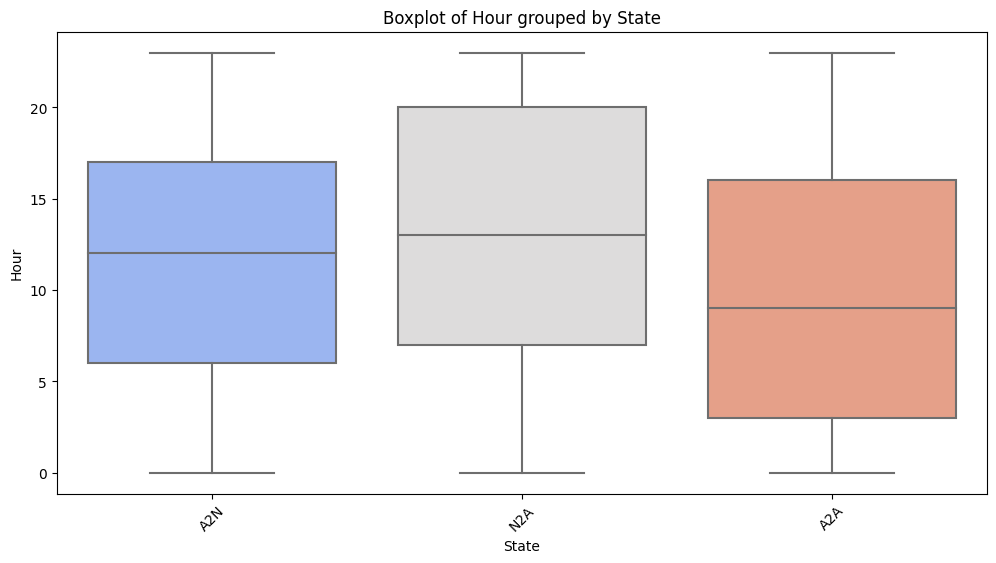

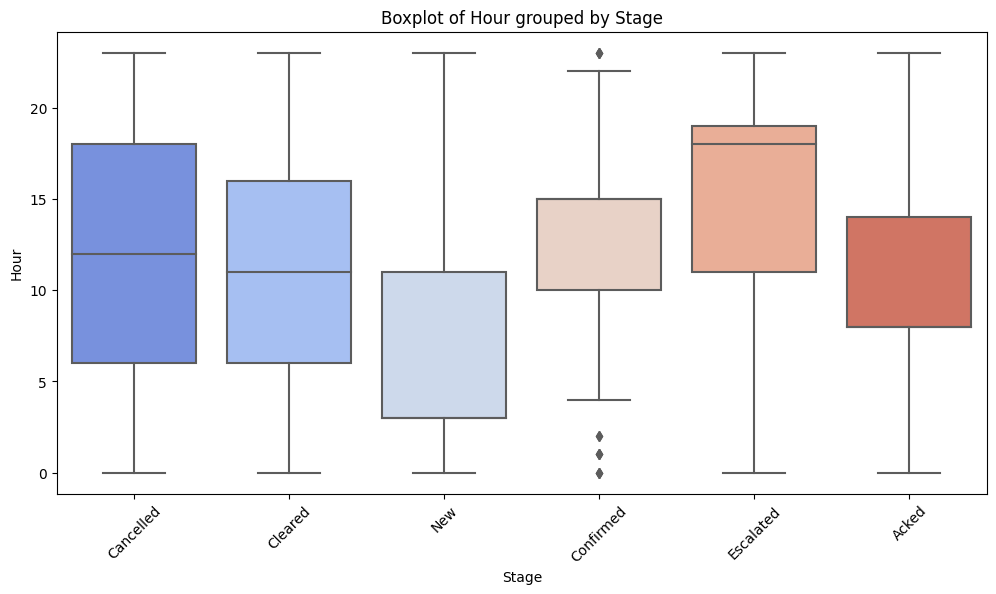

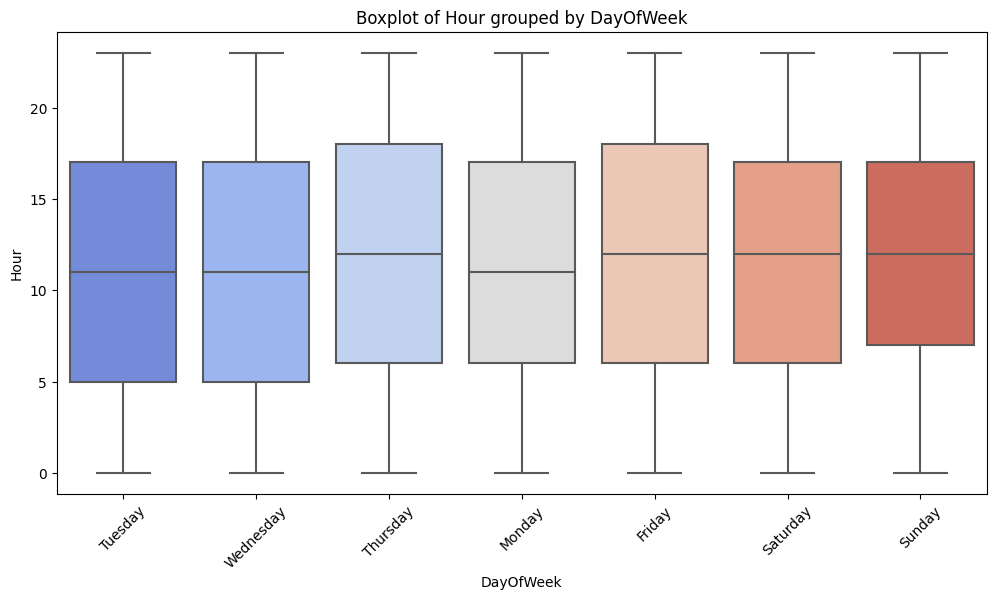

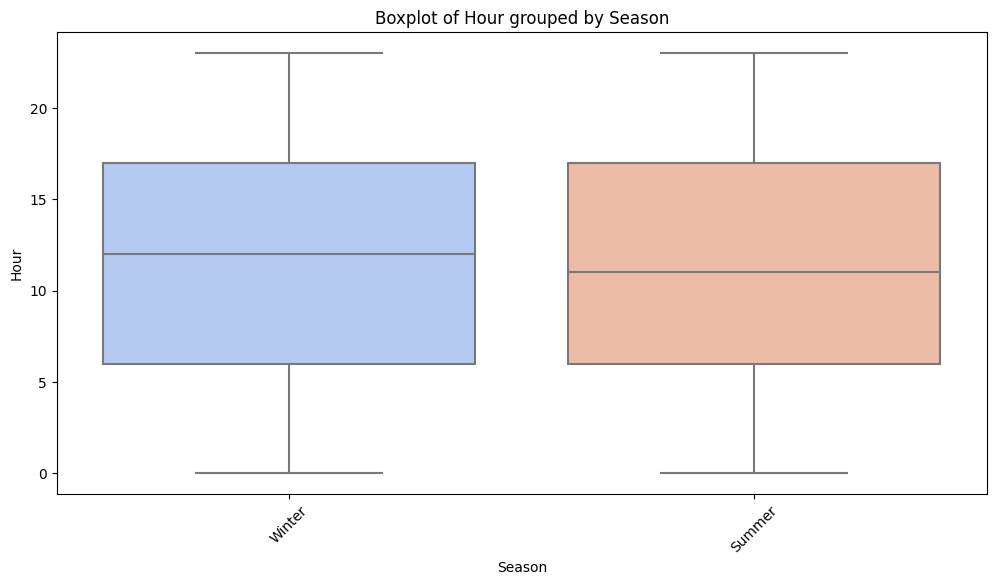

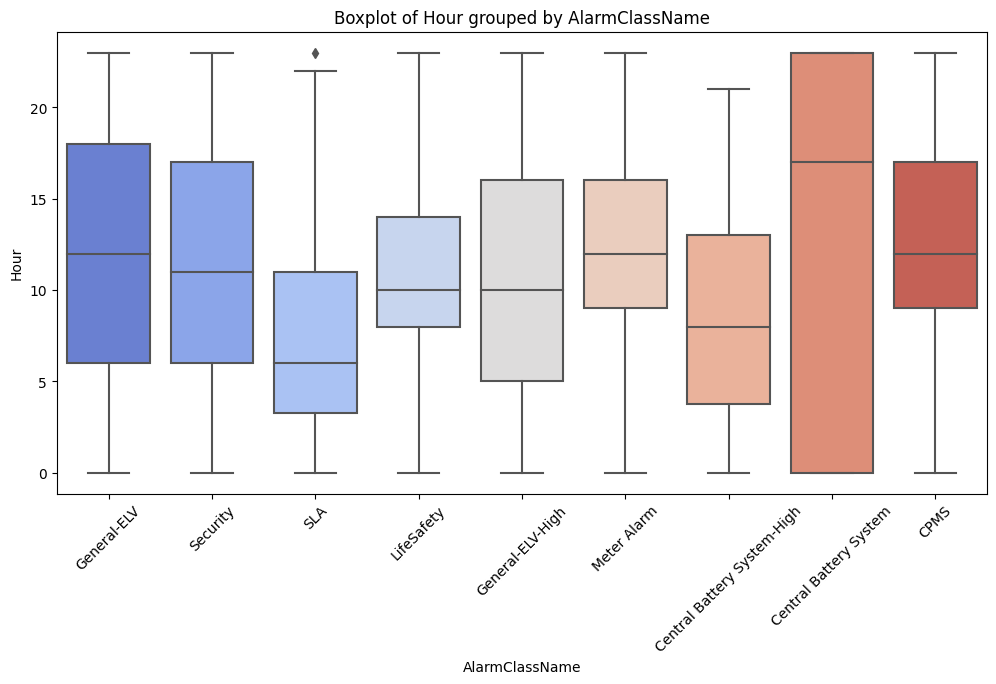

In [22]:
# Create boxplots for each numerical variable grouped by each categorical variable
for num_col in numerical_columns:
    for cat_col in categorical_columns:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df, palette='coolwarm')
        plt.title(f'Boxplot of {num_col} grouped by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45)
        plt.show()

In [23]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


In [ ]:
# Violin plots for numerical vs categorical
for num_col in numerical_columns:
    for cat_col in categorical_columns:
        plt.figure(figsize=(12, 6))
        sns.violinplot(x=cat_col, y=num_col, data=df, palette='muted', inner='quartile')
        plt.title(f'Violin Plot: {num_col} grouped by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45)
        plt.show()


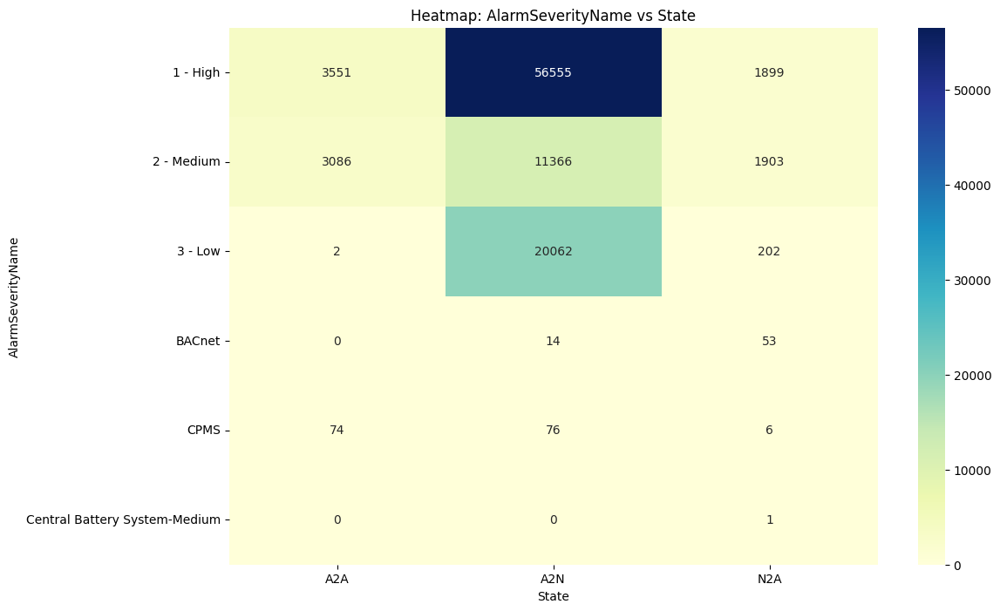

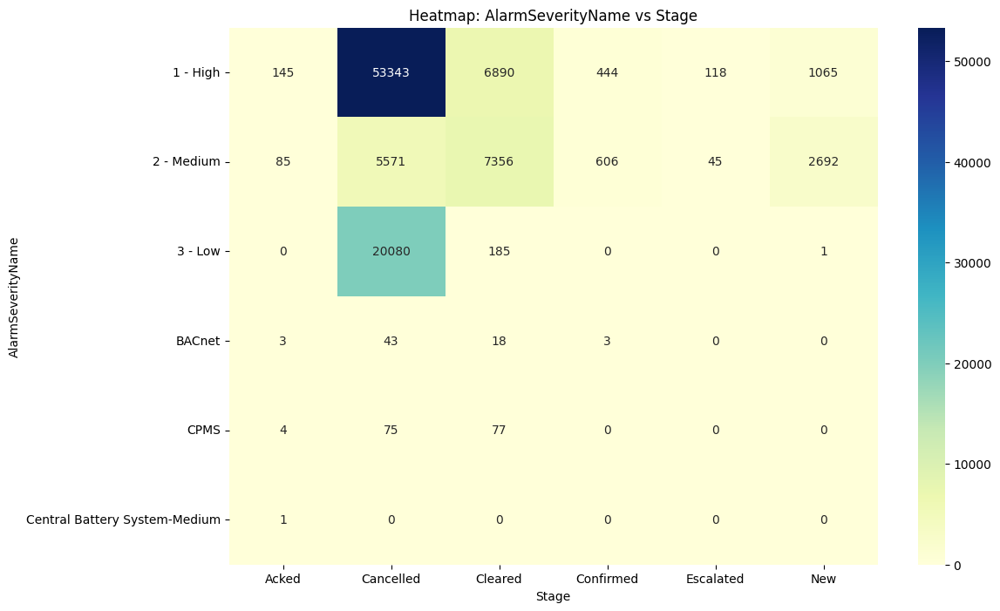

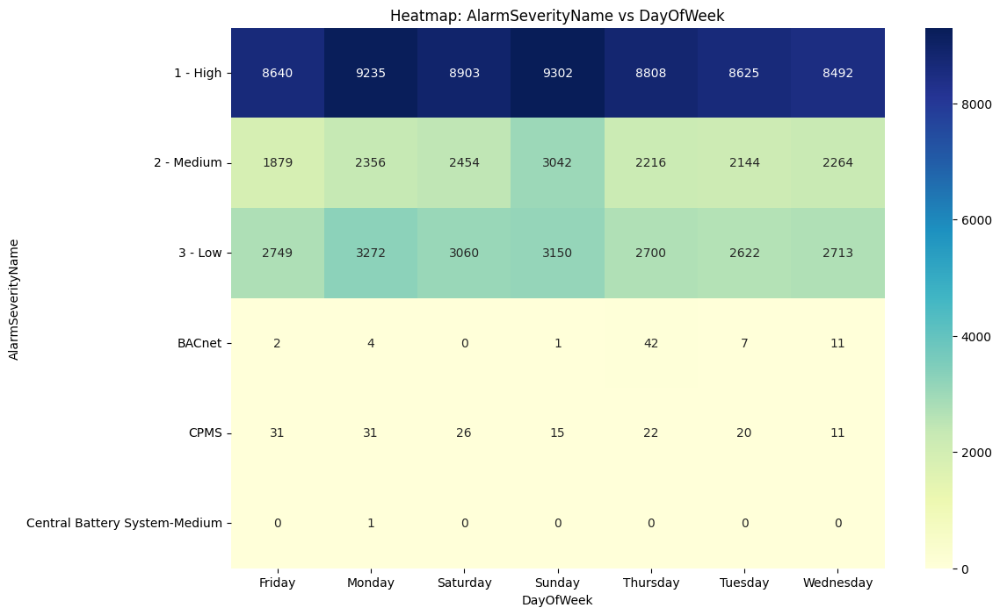

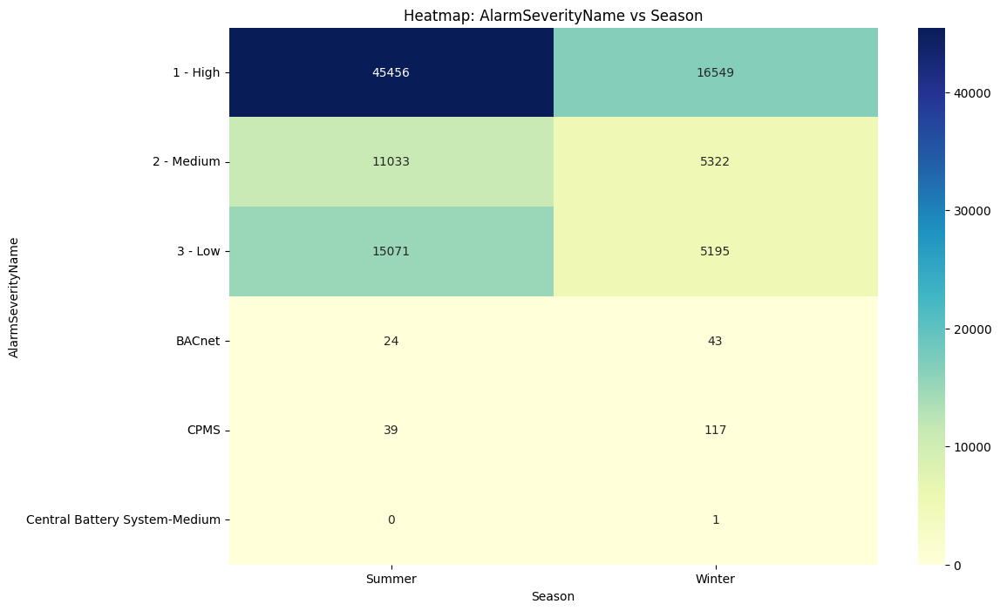

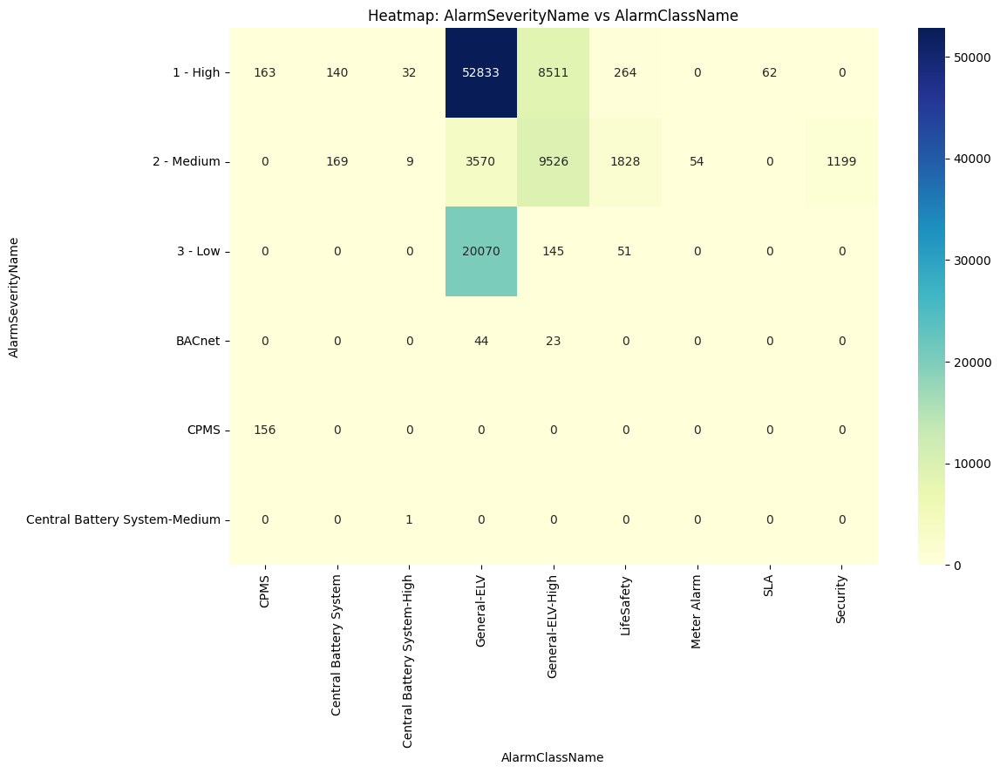

...

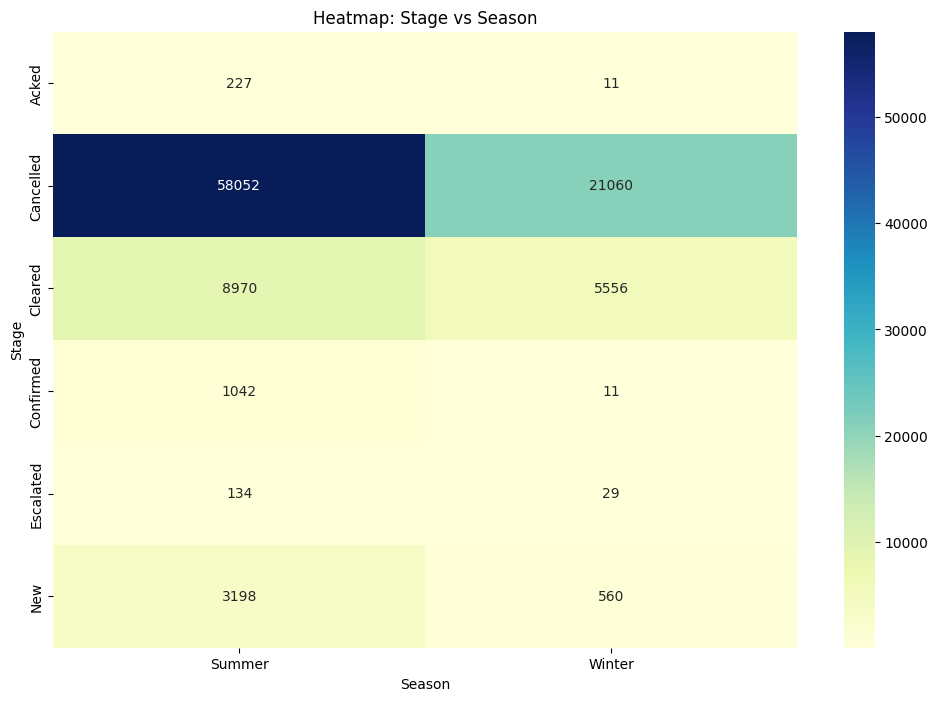

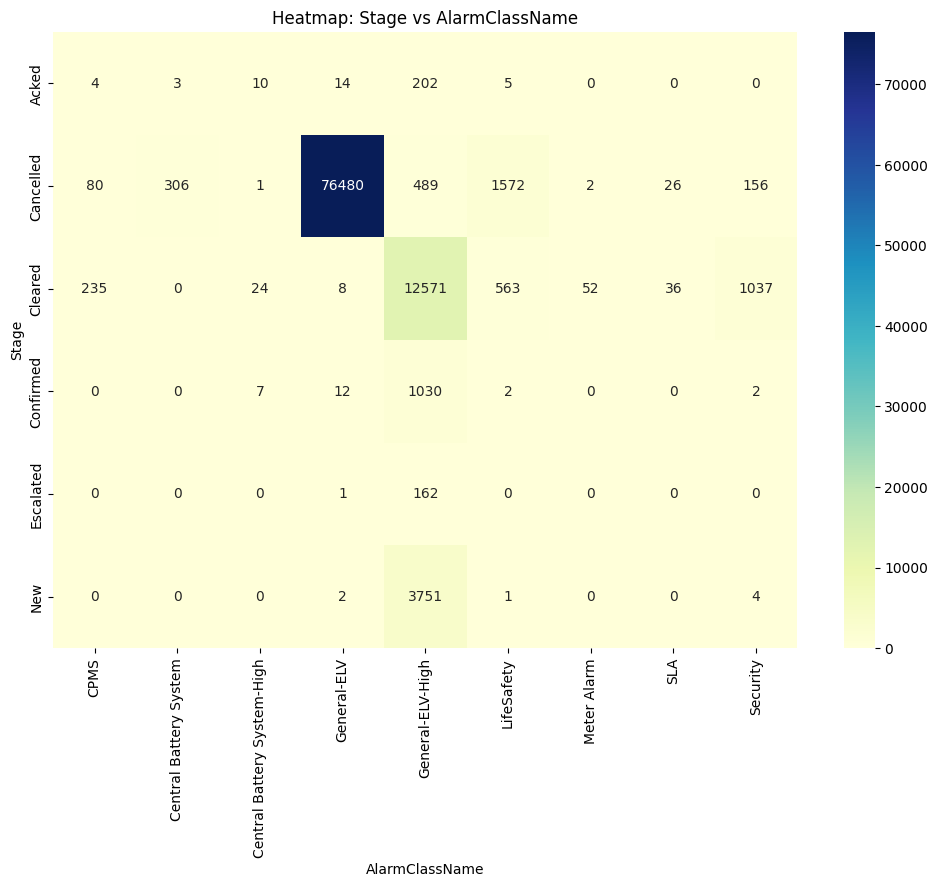

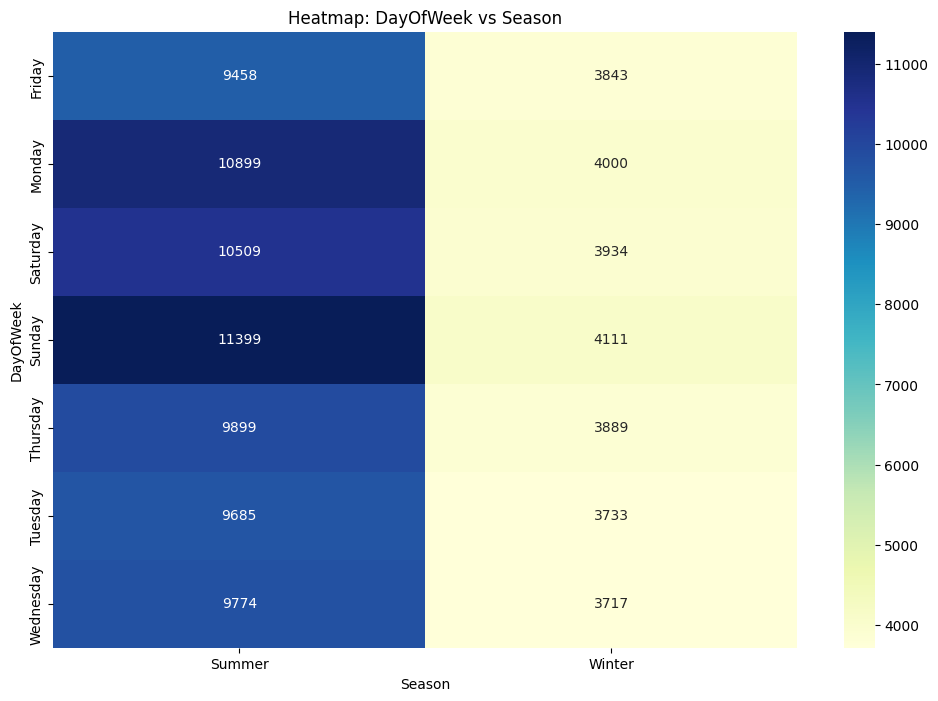

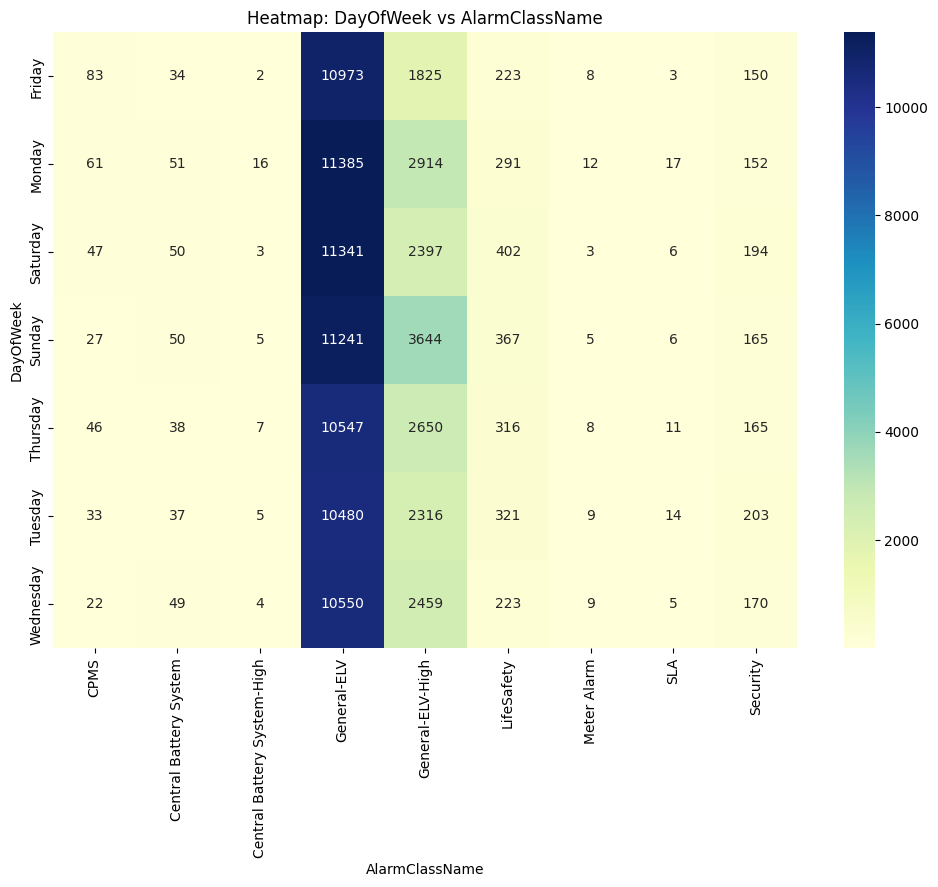

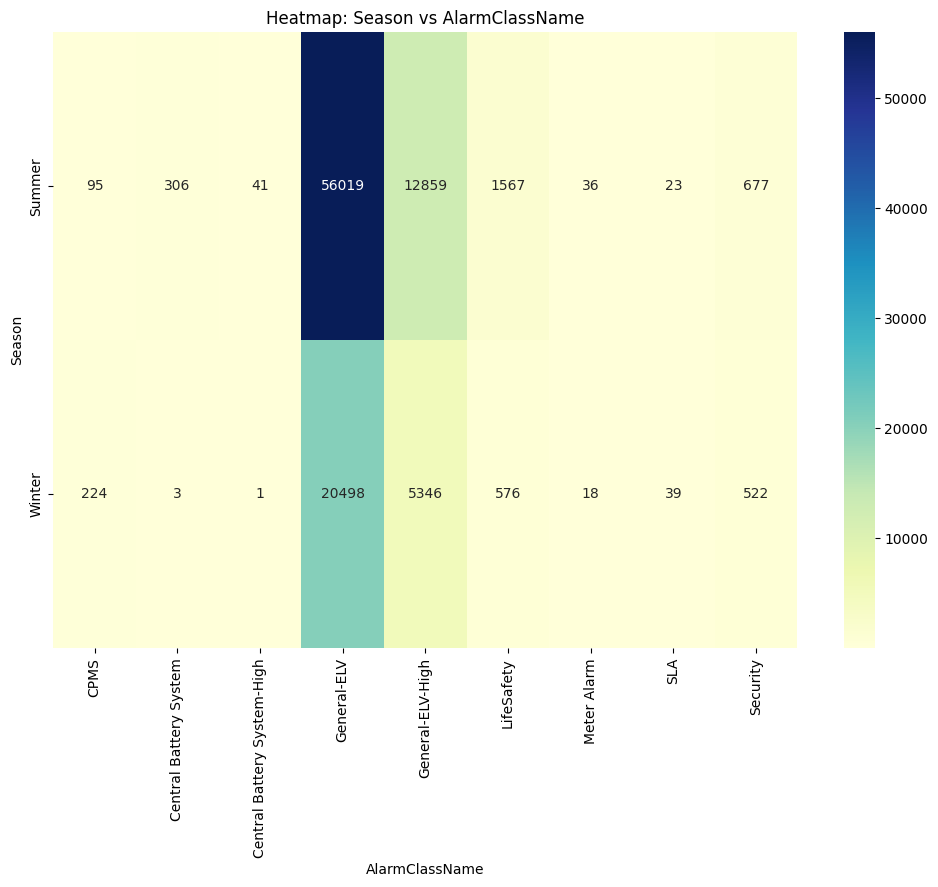

In [24]:
# Frequency heatmaps for categorical pairs
for i, cat_col1 in enumerate(categorical_columns):
    for cat_col2 in categorical_columns[i + 1:]:
        cross_tab = pd.crosstab(df[cat_col1], df[cat_col2])
        plt.figure(figsize=(12, 8))
        sns.heatmap(cross_tab, annot=True, fmt='d', cmap='YlGnBu')
        plt.title(f'Heatmap: {cat_col1} vs {cat_col2}')
        plt.xlabel(cat_col2)
        plt.ylabel(cat_col1)
        plt.show()


In [25]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


In [28]:
df.dtypes

DateTime              object
ProcessID             object
AssetID               object
AlarmSeverityName     object
State                 object
TransactionMessage    object
Stage                 object
AlarmClassName        object
Year                   int64
Month                  int64
Day                    int64
DayOfWeek             object
Season                object
Hour                   int64
ProcessedMessage      object
dtype: object

In [29]:
df_datetime = df.copy()
df_datetime

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


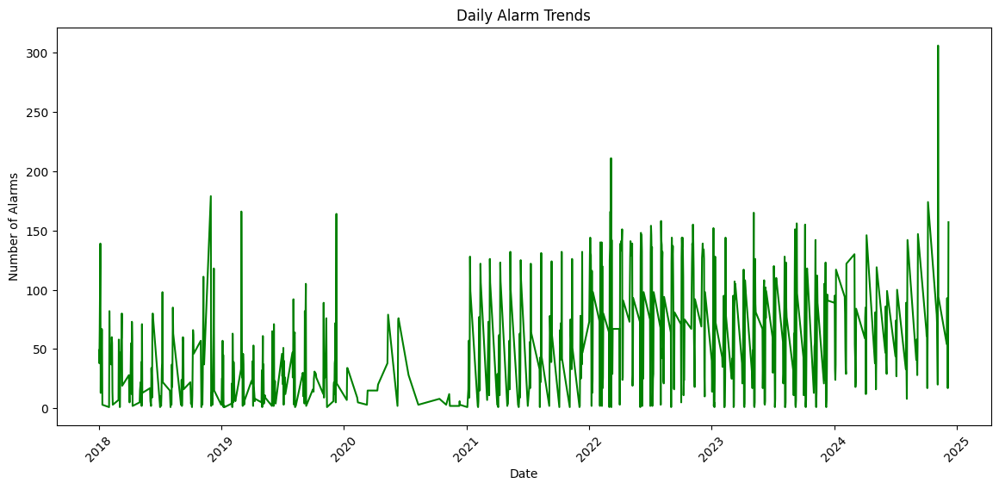

In [30]:
# Convert the 'DateTime' column to datetime format
df_datetime['DateTime'] = pd.to_datetime(df_datetime['DateTime'], errors='coerce')

# Group by the date (extract date part from DateTime) and count the number of alarms
daily_trends = df_datetime.groupby(df_datetime['DateTime'].dt.date).size()

# Plot daily alarm trends
plt.figure(figsize=(14, 6))
daily_trends.plot(kind='line', color='green')
plt.title("Daily Alarm Trends")
plt.xlabel("Date")
plt.ylabel("Number of Alarms")
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


In [31]:
df

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


In [32]:
# Check for null values
null_values = df.isnull().sum()

# Display the count of null values in each column
print("Null values in each column:")
print(null_values)

Null values in each column:
DateTime              0
ProcessID             0
AssetID               0
AlarmSeverityName     0
State                 0
TransactionMessage    0
Stage                 0
AlarmClassName        0
Year                  0
Month                 0
Day                   0
DayOfWeek             0
Season                0
Hour                  0
ProcessedMessage      0
dtype: int64


In [33]:
df_one = df.copy()
df_one

,DateTime,ProcessID,AssetID,AlarmSeverityName,State,TransactionMessage,Stage,AlarmClassName,Year,Month,Day,DayOfWeek,Season,Hour,ProcessedMessage
0,02-01-2018 22:45,IBMS/201801024100783,1-JK1-JK1-01-E.02-AC-ACON-VAVU-0047,3 - Low,A2N,VAV-J09-01-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,2,Tuesday,Winter,22,vavj0901029 space temp alarm
1,03-01-2018 01:41,IBMS/201801024101029,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,1,vavj0900027 space temp alarm
2,03-01-2018 03:08,IBMS/201801034101175,1-JK1-JK1-00-C.27-AC-ACON-VAVU-0019,3 - Low,A2N,VAV-J09-00-027 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,3,vavj0900027 space temp alarm
3,03-01-2018 07:12,IBMS/201801034101667,1-JK1-JK1-00-D.01-AC-ACON-VAVU-0021,3 - Low,A2N,VAV-J09-00-029 SPACE TEMP ALARM,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,7,vavj0900029 space temp alarm
4,03-01-2018 09:04,IBMS/201801034102043,0-JK1-JK1-B2-1.01-AC-ACON-MAHU-0003,2 - Medium,A2N,MAU-JK1-B1-001 Dis Air Temp,Cancelled,General-ELV,2018,1,3,Wednesday,Winter,9,maujk1b1001 dis air temp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102314,26-06-2024 00:12,IBMS/2024062533939735,1-I01-I02-03-IA0.02-AC-ACON-ZOCD-0002,1 - High,N2A,Low Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,low temperature fault
102315,26-06-2024 00:12,IBMS/2024062533939736,1-I01-I02-00-IA1.04-AC-ACON-ZOCD-0005,1 - High,A2A,High Temperature Fault,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,high temperature fault
102316,26-06-2024 00:13,IBMS/2024062533939741,1-I01-I02-00-IA1.02-AC-ACON-ZOCD-0002,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point
102317,26-06-2024 00:13,IBMS/2024062533939743,1-I01-I02-01-IA1.02-AC-ACON-ZOCD-0003,2 - Medium,A2A,Temperature above Set Point,New,General-ELV-High,2024,6,26,Wednesday,Summer,0,temperature set point


In [34]:
# Drop unnecessary columns
columns_to_drop = ['Year', 'Month', 'Day', 'Hour', 'TransactionMessage']
df_one = df_one.drop(columns=columns_to_drop, axis=1)

# Display updated DataFrame structure
print("Updated DataFrame:")
df_one.info()


Updated DataFrame:
<class 'pandas.core.frame.DataFrame'>
Index: 98850 entries, 0 to 102318
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   DateTime           98850 non-null  object
 1   ProcessID          98850 non-null  object
 2   AssetID            98850 non-null  object
 3   AlarmSeverityName  98850 non-null  object
 4   State              98850 non-null  object
 5   Stage              98850 non-null  object
 6   AlarmClassName     98850 non-null  object
 7   DayOfWeek          98850 non-null  object
 8   Season             98850 non-null  object
 9   ProcessedMessage   98850 non-null  object
dtypes: object(10)
memory usage: 8.3+ MB


In [35]:
# Optimize object columns with categorical data
categorical_cols = ['AlarmSeverityName', 'State', 'Stage', 'AlarmClassName', 'DayOfWeek', 'Season']
df_one[categorical_cols] = df_one[categorical_cols].astype('category')

# Check updated memory usage
print("Memory usage after optimization:")
print(df_one.info())


Memory usage after optimization:
<class 'pandas.core.frame.DataFrame'>
Index: 98850 entries, 0 to 102318
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   DateTime           98850 non-null  object  
 1   ProcessID          98850 non-null  object  
 2   AssetID            98850 non-null  object  
 3   AlarmSeverityName  98850 non-null  category
 4   State              98850 non-null  category
 5   Stage              98850 non-null  category
 6   AlarmClassName     98850 non-null  category
 7   DayOfWeek          98850 non-null  category
 8   Season             98850 non-null  category
 9   ProcessedMessage   98850 non-null  object  
dtypes: category(6), object(4)
memory usage: 4.3+ MB
None


In [36]:
df_two =  df_one.drop(columns=['ProcessedMessage'])


df_two.info()


<class 'pandas.core.frame.DataFrame'>
Index: 98850 entries, 0 to 102318
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   DateTime           98850 non-null  object  
 1   ProcessID          98850 non-null  object  
 2   AssetID            98850 non-null  object  
 3   AlarmSeverityName  98850 non-null  category
 4   State              98850 non-null  category
 5   Stage              98850 non-null  category
 6   AlarmClassName     98850 non-null  category
 7   DayOfWeek          98850 non-null  category
 8   Season             98850 non-null  category
dtypes: category(6), object(3)
memory usage: 3.6+ MB


In [37]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [38]:
X = df_two.drop(columns=['AlarmSeverityName', 'DateTime'])  # Features
y = df_two['AlarmSeverityName']  # Target variable

# Initialize the label encoder
label_encoder = LabelEncoder()

# Encode the categorical features in X
categorical_columns = X.select_dtypes(include=['category', 'object']).columns  # Get all categorical columns

for col in categorical_columns:
    X[col] = label_encoder.fit_transform(X[col])


In [39]:
# Remove the class with only one member from the dataset
y_counts = y.value_counts()
rare_class = y_counts[y_counts == 1].index
df_two = df_two[~df_two['AlarmSeverityName'].isin(rare_class)]
X = df_two.drop(columns=['AlarmSeverityName', 'DateTime'])
y = df_two['AlarmSeverityName']


In [42]:
df_two.dtypes
df_two['DateTime'] = pd.to_datetime(df_two['DateTime'], errors='coerce')
df_two.dtypes

DateTime             datetime64[ns]
ProcessID                    object
AssetID                      object
AlarmSeverityName          category
State                      category
Stage                      category
AlarmClassName             category
DayOfWeek                  category
Season                     category
dtype: object

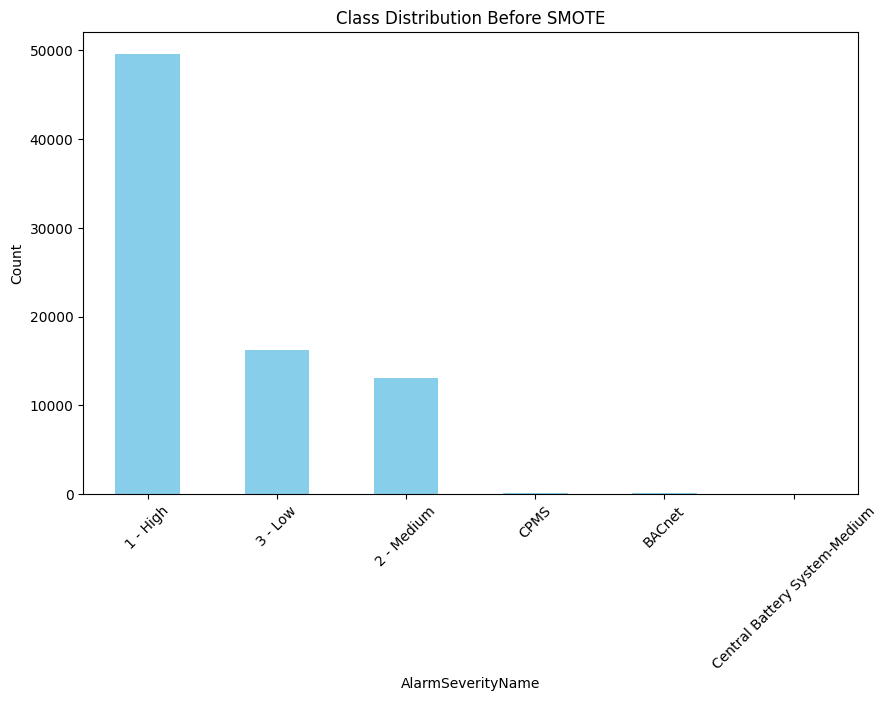

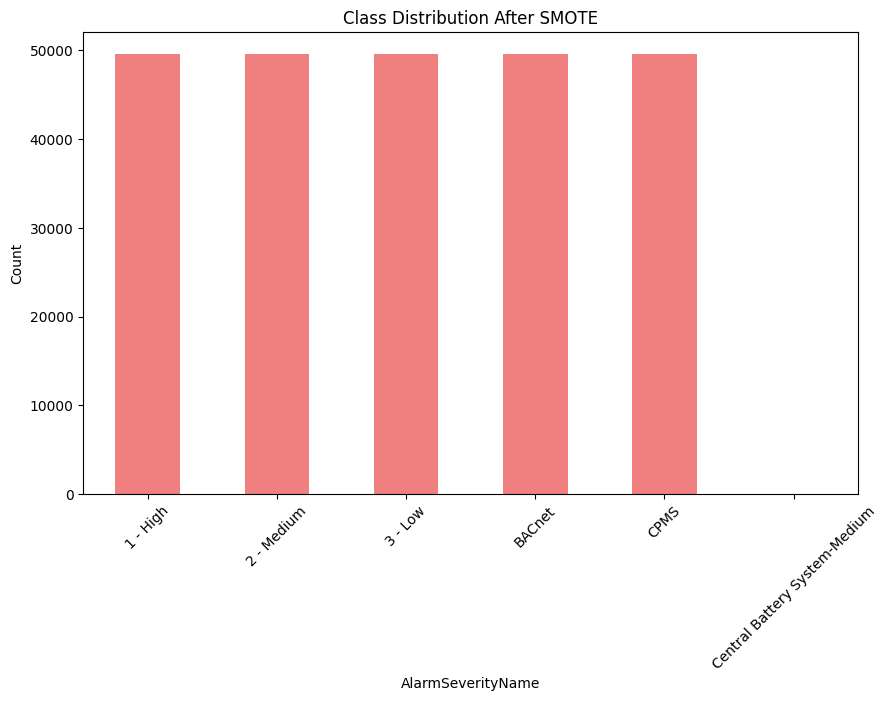

In [43]:
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Select feature columns and target
X = df_two.drop(columns=['AlarmSeverityName', 'DateTime'])  # Dropping target and datetime
y = df_two['AlarmSeverityName']  # Target variable

# Convert categorical columns to numeric using LabelEncoder
label_encoder = LabelEncoder()

# Apply LabelEncoder to each categorical column in the original DataFrame (before imputation)
for column in X.select_dtypes(include=['category', 'object']).columns:
    X[column] = label_encoder.fit_transform(X[column])

# Handle missing values after encoding categorical columns
imputer = SimpleImputer(strategy='most_frequent')
X = imputer.fit_transform(X)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Visualize class imbalance before SMOTE
plt.figure(figsize=(10, 6))
y_train.value_counts().plot(kind='bar', color='skyblue')
plt.title('Class Distribution Before SMOTE')
plt.xlabel('AlarmSeverityName')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Visualize class distribution after SMOTE
plt.figure(figsize=(10, 6))
y_train_resampled.value_counts().plot(kind='bar', color='lightcoral')
plt.title('Class Distribution After SMOTE')
plt.xlabel('AlarmSeverityName')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


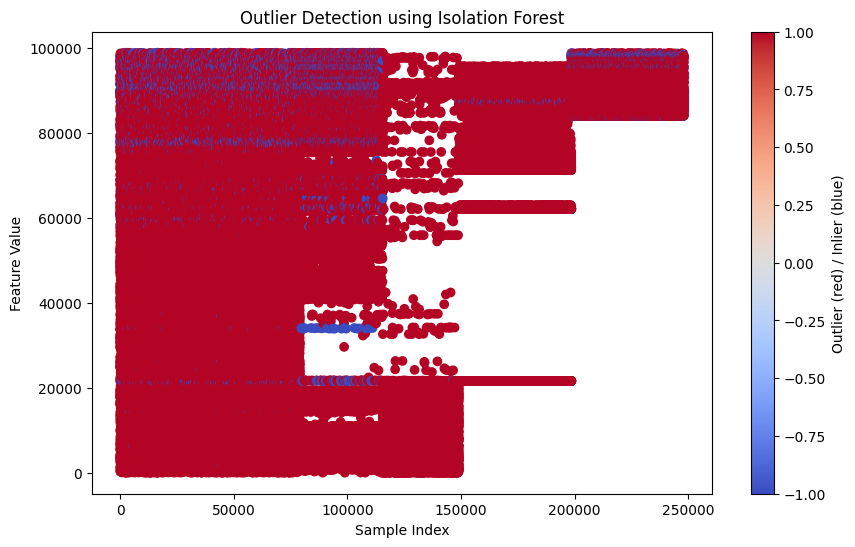

Number of outliers detected: 12360


In [44]:
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import pandas as pd

# Fit Isolation Forest for outlier detection
iso_forest = IsolationForest(contamination=0.05, random_state=42)  # Set contamination as 5% for example
y_train_outliers = iso_forest.fit_predict(X_train_resampled)

# Convert the result to a Pandas Series (without using index)
y_train_outliers = pd.Series(y_train_outliers)

# Visualizing Outliers and Inliers
plt.figure(figsize=(10, 6))
plt.scatter(range(len(X_train_resampled)), X_train_resampled[:, 0], c=y_train_outliers, cmap='coolwarm')
plt.title('Outlier Detection using Isolation Forest')
plt.xlabel('Sample Index')
plt.ylabel('Feature Value')
plt.colorbar(label='Outlier (red) / Inlier (blue)')
plt.show()

# Count the outliers
outlier_count = (y_train_outliers == -1).sum()
print(f"Number of outliers detected: {outlier_count}")


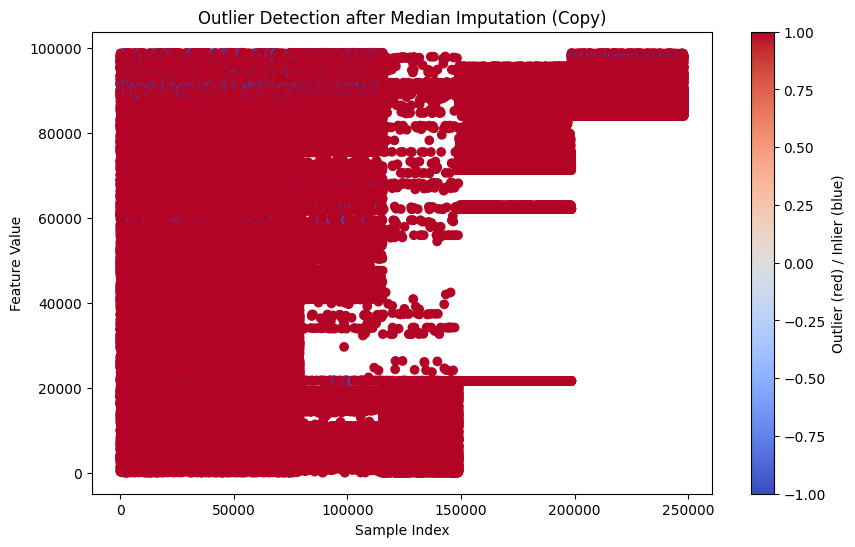

Number of outliers detected after median imputation (on copy): 2290


In [45]:
from sklearn.impute import SimpleImputer
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import pandas as pd

# Create a copy of X_train_resampled
X_train_resampled_copy = X_train_resampled.copy()

# Apply Median Imputation on the copied data
imputer = SimpleImputer(strategy='median')
X_train_resampled_copy_imputed = imputer.fit_transform(X_train_resampled_copy)

# Fit Isolation Forest for outlier detection on the imputed data copy
iso_forest = IsolationForest(contamination=0.01, random_state=42)  # Contamination ratio as 1%
y_train_outliers_imputed_copy = iso_forest.fit_predict(X_train_resampled_copy_imputed)

# Convert the result to a Pandas Series
y_train_outliers_imputed_copy = pd.Series(y_train_outliers_imputed_copy)

# Visualizing Outliers and Inliers after median imputation
plt.figure(figsize=(10, 6))
plt.scatter(range(len(X_train_resampled_copy_imputed)), X_train_resampled_copy_imputed[:, 0], c=y_train_outliers_imputed_copy, cmap='coolwarm')
plt.title('Outlier Detection after Median Imputation (Copy)')
plt.xlabel('Sample Index')
plt.ylabel('Feature Value')
plt.colorbar(label='Outlier (red) / Inlier (blue)')
plt.show()

# Count the outliers after median imputation on the copy
outlier_count_imputed_copy = (y_train_outliers_imputed_copy == -1).sum()
print(f"Number of outliers detected after median imputation (on copy): {outlier_count_imputed_copy}")


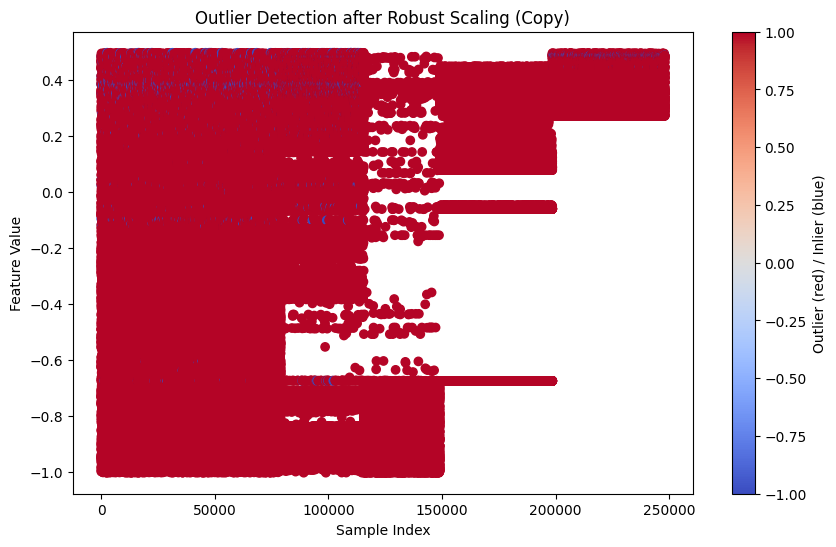

Number of outliers detected after scaling (on copy): 2290


In [46]:
from sklearn.preprocessing import RobustScaler

# Create a copy of X_train_resampled
X_train_resampled_copy = X_train_resampled.copy()

# Apply RobustScaler on the copied data
scaler = RobustScaler()
X_train_resampled_scaled_copy = scaler.fit_transform(X_train_resampled_copy)

# Check for outliers on the scaled data copy (as per previous code)
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import pandas as pd

# Fit Isolation Forest for outlier detection on scaled data copy
iso_forest = IsolationForest(contamination=0.01, random_state=42)  # Contamination ratio as 1%
y_train_outliers_scaled_copy = iso_forest.fit_predict(X_train_resampled_scaled_copy)

# Convert the result to a Pandas Series
y_train_outliers_scaled_copy = pd.Series(y_train_outliers_scaled_copy)

# Visualizing Outliers and Inliers after scaling
plt.figure(figsize=(10, 6))
plt.scatter(range(len(X_train_resampled_scaled_copy)), X_train_resampled_scaled_copy[:, 0], c=y_train_outliers_scaled_copy, cmap='coolwarm')
plt.title('Outlier Detection after Robust Scaling (Copy)')
plt.xlabel('Sample Index')
plt.ylabel('Feature Value')
plt.colorbar(label='Outlier (red) / Inlier (blue)')
plt.show()

# Count the outliers after scaling on the copy
outlier_count_scaled_copy = (y_train_outliers_scaled_copy == -1).sum()
print(f"Number of outliers detected after scaling (on copy): {outlier_count_scaled_copy}")


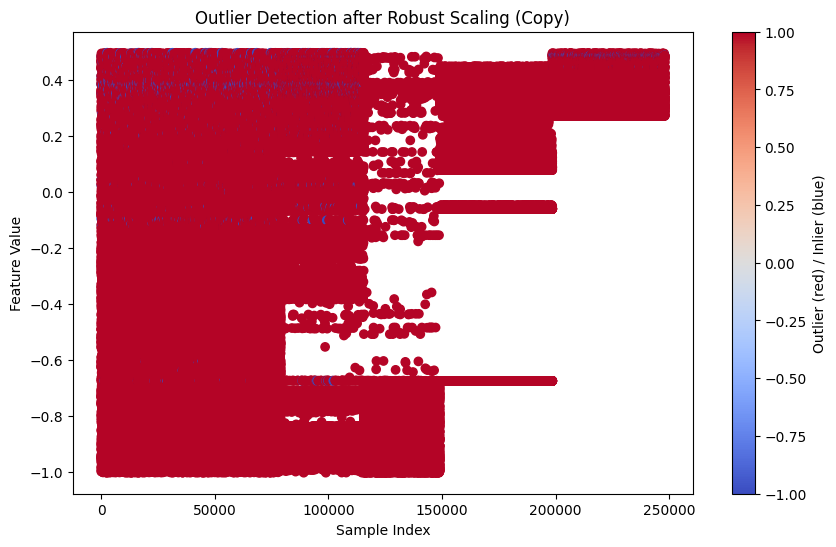

Number of outliers detected after scaling (on copy): 2290
After removing outliers: 245730 samples


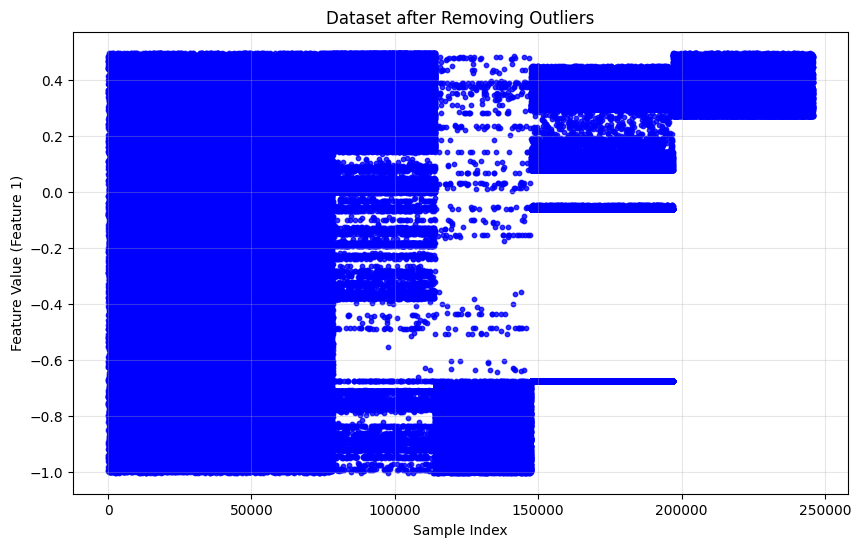

In [47]:
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Create a copy of X_train_resampled
X_train_resampled_copy = X_train_resampled.copy()

# Apply RobustScaler on the copied data
scaler = RobustScaler()
X_train_resampled_scaled_copy = scaler.fit_transform(X_train_resampled_copy)

# Fit Isolation Forest for outlier detection on scaled data copy
iso_forest = IsolationForest(contamination=0.01, random_state=42)  # Contamination ratio as 1%
y_train_outliers_scaled_copy = iso_forest.fit_predict(X_train_resampled_scaled_copy)

# Convert the result to a Pandas Series
y_train_outliers_scaled_copy = pd.Series(y_train_outliers_scaled_copy)

# Visualizing Outliers and Inliers after scaling
plt.figure(figsize=(10, 6))
plt.scatter(
    range(len(X_train_resampled_scaled_copy)),
    X_train_resampled_scaled_copy[:, 0],
    c=y_train_outliers_scaled_copy,
    cmap='coolwarm'
)
plt.title('Outlier Detection after Robust Scaling (Copy)')
plt.xlabel('Sample Index')
plt.ylabel('Feature Value')
plt.colorbar(label='Outlier (red) / Inlier (blue)')
plt.show()

# Count the outliers after scaling on the copy
outlier_count_scaled_copy = (y_train_outliers_scaled_copy == -1).sum()
print(f"Number of outliers detected after scaling (on copy): {outlier_count_scaled_copy}")

# Remove the detected outliers
# Convert the outlier series to a boolean mask where -1 is an outlier
outlier_mask_scaled_copy = y_train_outliers_scaled_copy.values == -1

# Remove the outliers from the scaled dataset
X_train_resampled_scaled_clean = X_train_resampled_scaled_copy[~outlier_mask_scaled_copy]

# Clean the labels (assuming y_train_resampled corresponds to X_train_resampled)
y_train_resampled_clean = y_train_resampled[~outlier_mask_scaled_copy]

# Display the number of remaining samples
print(f"After removing outliers: {X_train_resampled_scaled_clean.shape[0]} samples")

# Visualizing the dataset after removing outliers
plt.figure(figsize=(10, 6))
plt.scatter(
    range(len(X_train_resampled_scaled_clean)),
    X_train_resampled_scaled_clean[:, 0],
    c='blue',
    s=10,
    alpha=0.8
)
plt.title('Dataset after Removing Outliers')
plt.xlabel('Sample Index')
plt.ylabel('Feature Value (Feature 1)')
plt.grid(alpha=0.3)
plt.show()


Random Forest Accuracy: 0.97829

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.99      0.91      0.95      9855
  2 - Medium       0.92      0.99      0.96      9682
     3 - Low       1.00      0.99      0.99      9921
      BACnet       0.98      1.00      0.99      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.98     49146
   macro avg       0.98      0.98      0.98     49146
weighted avg       0.98      0.98      0.98     49146



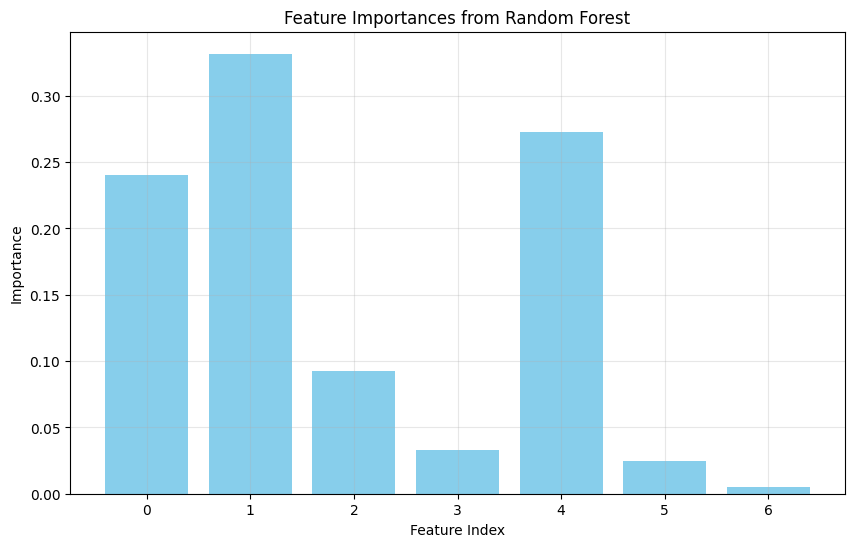

In [49]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Splitting the cleaned dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X_train_resampled_scaled_clean,
    y_train_resampled_clean,
    test_size=0.2,
    random_state=42,
    stratify=y_train_resampled_clean
)

# Initializing the Random Forest classifier
rf_model = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    random_state=42
)

# Training the model
rf_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = rf_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {accuracy:.5f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature Importance Visualization (optional)
importances = rf_model.feature_importances_
plt.figure(figsize=(10, 6))
plt.bar(range(len(importances)), importances, color='skyblue')
plt.title('Feature Importances from Random Forest')
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.grid(alpha=0.3)
plt.show()


Logistic Regression Accuracy: 0.87547

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.82      0.84      0.83      9855
  2 - Medium       0.76      0.73      0.74      9682
     3 - Low       0.93      0.98      0.95      9921
      BACnet       0.87      0.83      0.85      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.88     49146
   macro avg       0.87      0.88      0.87     49146
weighted avg       0.87      0.88      0.87     49146



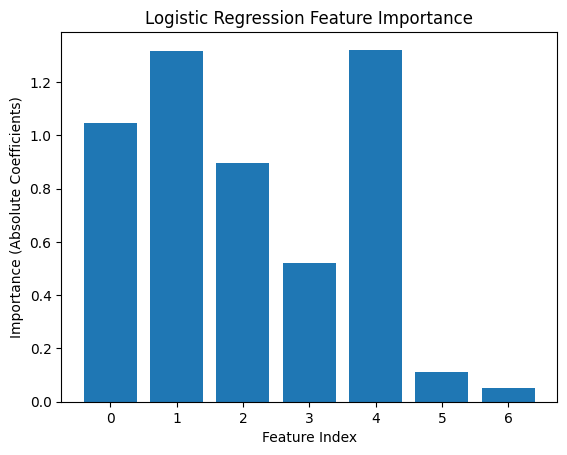

In [50]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import matplotlib.pyplot as plt

# Splitting the cleaned dataset
X_train, X_test, y_train, y_test = train_test_split(
    X_train_resampled_scaled_clean,
    y_train_resampled_clean,
    test_size=0.2,
    random_state=42,
    stratify=y_train_resampled_clean
)

# Initializing Logistic Regression
log_model = LogisticRegression(random_state=42, max_iter=1000)

# Training the model
log_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = log_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Logistic Regression Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature Importance
feature_importance = np.abs(log_model.coef_[0])
plt.bar(range(len(feature_importance)), feature_importance)
plt.title("Logistic Regression Feature Importance")
plt.xlabel("Feature Index")
plt.ylabel("Importance (Absolute Coefficients)")
plt.show()


In [51]:
from sklearn.svm import SVC

# Initializing SVM classifier
svm_model = SVC(kernel='rbf', C=1.0, random_state=42)

# Training the model
svm_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = svm_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"SVM Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


SVM Accuracy: 0.95312

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.96      0.88      0.92      9855
  2 - Medium       0.91      0.89      0.90      9682
     3 - Low       0.93      0.99      0.96      9921
      BACnet       0.96      1.00      0.98      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.95     49146
   macro avg       0.95      0.95      0.95     49146
weighted avg       0.95      0.95      0.95     49146



In [52]:
from sklearn.neighbors import KNeighborsClassifier

# Initializing KNN classifier
knn_model = KNeighborsClassifier(n_neighbors=5)

# Training the model
knn_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = knn_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"KNN Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


KNN Accuracy: 0.98523

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.98      0.96      0.97      9855
  2 - Medium       0.96      0.97      0.97      9682
     3 - Low       1.00      0.99      0.99      9921
      BACnet       1.00      1.00      1.00      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.99     49146
   macro avg       0.99      0.99      0.99     49146
weighted avg       0.99      0.99      0.99     49146



In [53]:
from sklearn.naive_bayes import GaussianNB

# Initializing Naive Bayes classifier
nb_model = GaussianNB()

# Training the model
nb_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = nb_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Naive Bayes Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Naive Bayes Accuracy: 0.88496

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.84      0.84      0.84      9855
  2 - Medium       0.73      0.85      0.79      9682
     3 - Low       0.93      0.98      0.96      9921
      BACnet       0.96      0.75      0.84      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.88     49146
   macro avg       0.89      0.89      0.89     49146
weighted avg       0.89      0.88      0.89     49146



Gradient Boosting Accuracy: 0.98502

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.98      0.95      0.97      9855
  2 - Medium       0.96      0.98      0.97      9682
     3 - Low       1.00      0.99      1.00      9921
      BACnet       0.99      1.00      1.00      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.99     49146
   macro avg       0.99      0.98      0.98     49146
weighted avg       0.99      0.99      0.99     49146



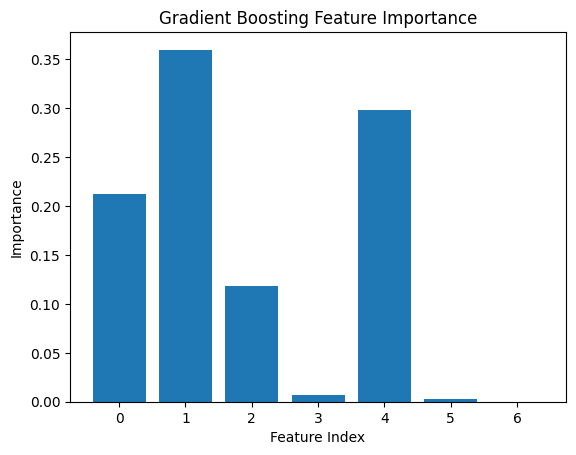

In [54]:
from sklearn.ensemble import GradientBoostingClassifier

# Initializing Gradient Boosting classifier
gb_model = GradientBoostingClassifier(random_state=42)

# Training the model
gb_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = gb_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Gradient Boosting Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature Importance
feature_importance = gb_model.feature_importances_
plt.bar(range(len(feature_importance)), feature_importance)
plt.title("Gradient Boosting Feature Importance")
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.show()


AdaBoost Accuracy: 0.44850

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.45      0.83      0.58      9855
  2 - Medium       0.21      0.24      0.23      9682
     3 - Low       0.15      0.14      0.15      9921
      BACnet       0.97      0.98      0.98      9921
        CPMS       1.00      0.04      0.07      9767

    accuracy                           0.45     49146
   macro avg       0.56      0.45      0.40     49146
weighted avg       0.56      0.45      0.40     49146



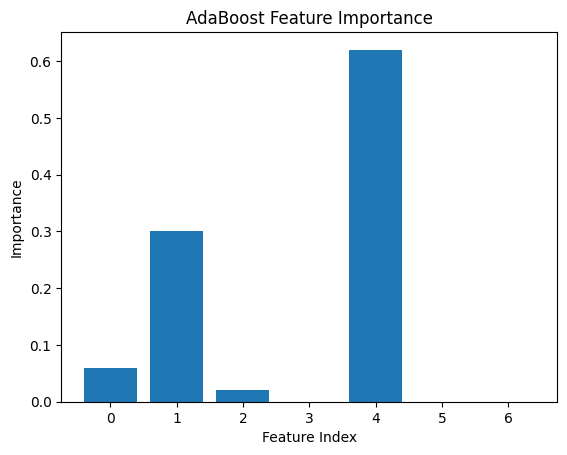

In [55]:
from sklearn.ensemble import AdaBoostClassifier

# Initializing AdaBoost classifier
ada_model = AdaBoostClassifier(random_state=42)

# Training the model
ada_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = ada_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"AdaBoost Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature Importance
feature_importance = ada_model.feature_importances_
plt.bar(range(len(feature_importance)), feature_importance)
plt.title("AdaBoost Feature Importance")
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.show()


Decision Tree Accuracy: 0.98022

Classification Report:
              precision    recall  f1-score   support

    1 - High       0.97      0.95      0.96      9855
  2 - Medium       0.95      0.96      0.95      9682
     3 - Low       1.00      0.99      1.00      9921
      BACnet       0.99      1.00      1.00      9921
        CPMS       1.00      1.00      1.00      9767

    accuracy                           0.98     49146
   macro avg       0.98      0.98      0.98     49146
weighted avg       0.98      0.98      0.98     49146



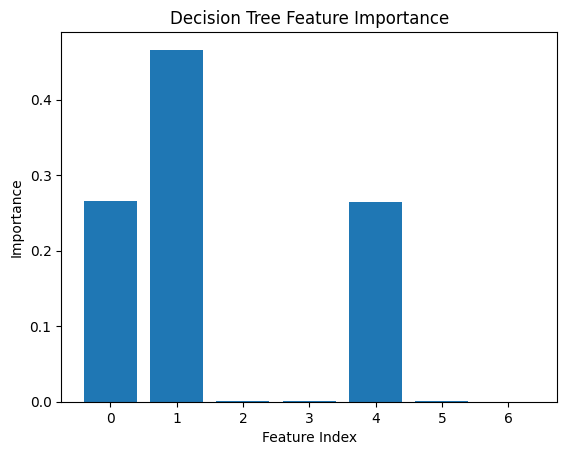

In [56]:
from sklearn.tree import DecisionTreeClassifier

# Initializing Decision Tree classifier
dt_model = DecisionTreeClassifier(random_state=42, max_depth=10)

# Training the model
dt_model.fit(X_train, y_train)

# Predicting on the test set
y_pred = dt_model.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Feature Importance
feature_importance = dt_model.feature_importances_
plt.bar(range(len(feature_importance)), feature_importance)
plt.title("Decision Tree Feature Importance")
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.show()


XGBoost Accuracy: 0.98913

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      9855
           1       0.97      0.98      0.97      9682
           2       1.00      0.99      0.99      9921
           3       1.00      1.00      1.00      9921
           4       1.00      1.00      1.00      9767

    accuracy                           0.99     49146
   macro avg       0.99      0.99      0.99     49146
weighted avg       0.99      0.99      0.99     49146



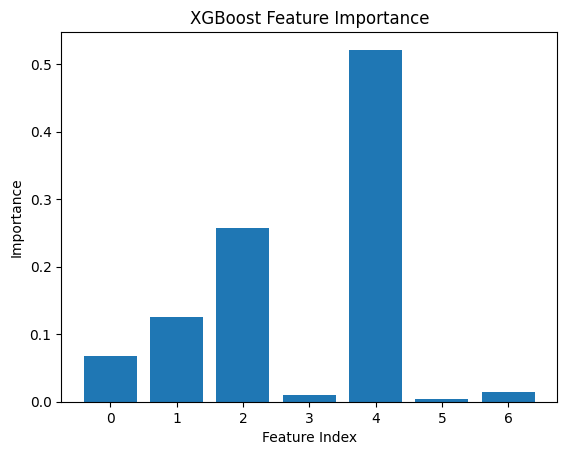

In [57]:
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

# Encode target labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Initializing XGBoost classifier
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')

# Training the model
xgb_model.fit(X_train, y_train_encoded)

# Predicting on the test set
y_pred = xgb_model.predict(X_test)

# Decoding the predictions back to original labels
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Evaluating the model
accuracy = accuracy_score(y_test_encoded, y_pred)
print(f"XGBoost Accuracy: {accuracy:.5f}")
print("\nClassification Report:")
print(classification_report(y_test_encoded, y_pred))

# Feature Importance
feature_importance = xgb_model.feature_importances_
plt.bar(range(len(feature_importance)), feature_importance)
plt.title("XGBoost Feature Importance")
plt.xlabel("Feature Index")
plt.ylabel("Importance")
plt.show()


In [58]:
!pip install shap


# EXPLAINABLE AI

In [67]:
import numpy as np
import pandas as pd

# Check if X_test is a numpy array or a pandas DataFrame
if isinstance(X_test, np.ndarray):
    print("X_test is a numpy array.")
    # You can assign column names from X_train or any known list of features
    X_test = pd.DataFrame(X_test)  # If no column names are available, columns will be unnamed
elif isinstance(X_test, pd.DataFrame):
    print("X_test is already a pandas DataFrame.")
    
# Now print the column names (features) in X_test
print("Features available in X_test:")
print(X_test.columns)


X_test is a numpy array.
Features available in X_test:
RangeIndex(start=0, stop=7, step=1)


Generating SHAP summary plot (global feature importance)...


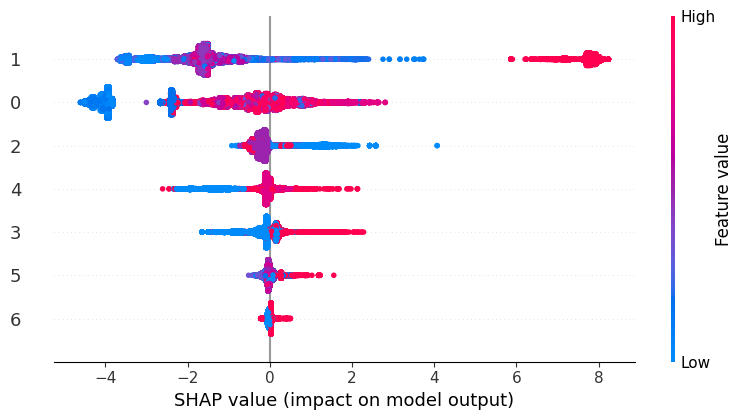

Generating SHAP bar chart...


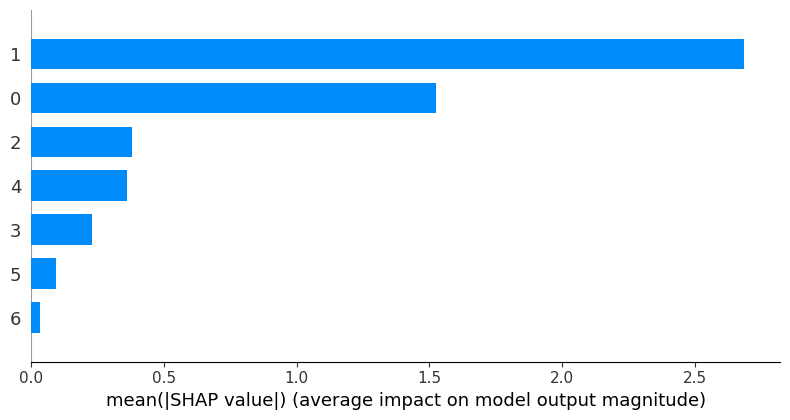

Generating SHAP dependence plot for feature 0...


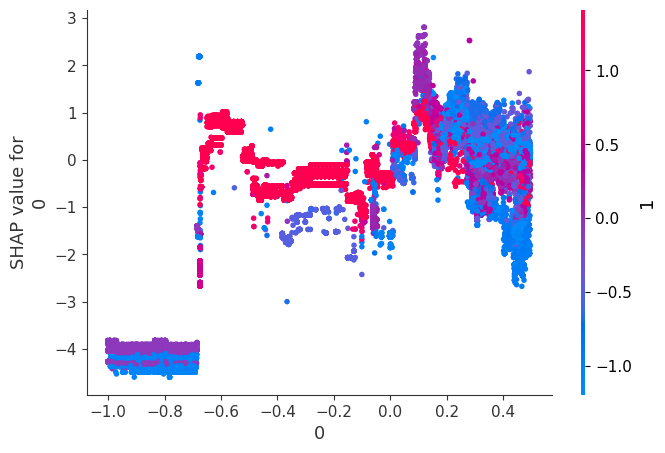

Generating SHAP dependence plot for feature 1...


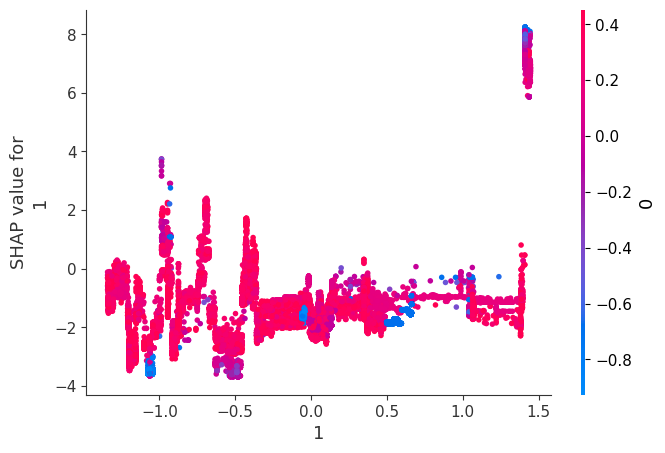

Generating SHAP dependence plot for feature 2...


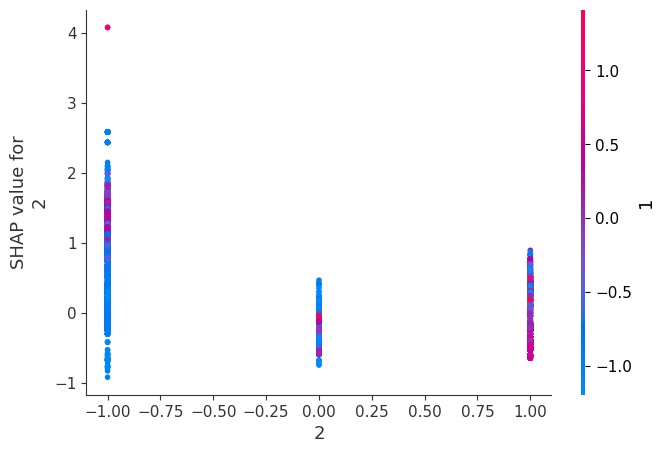

Generating SHAP dependence plot for feature 3...


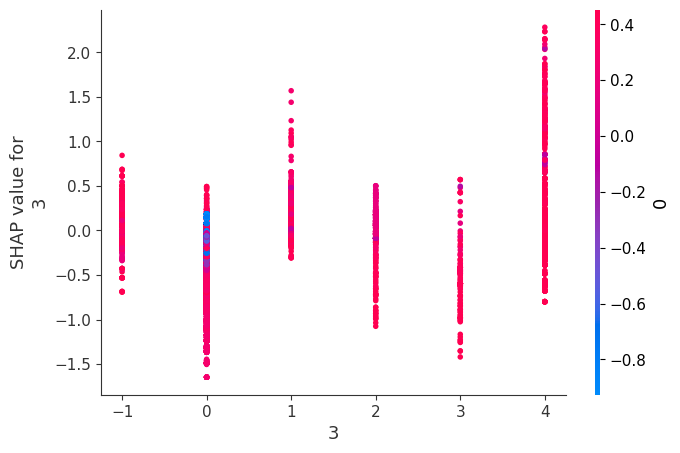

Generating SHAP dependence plot for feature 4...


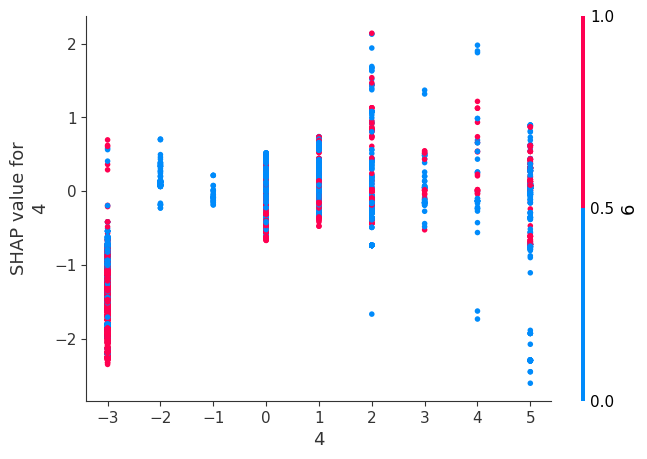

Generating SHAP dependence plot for feature 5...


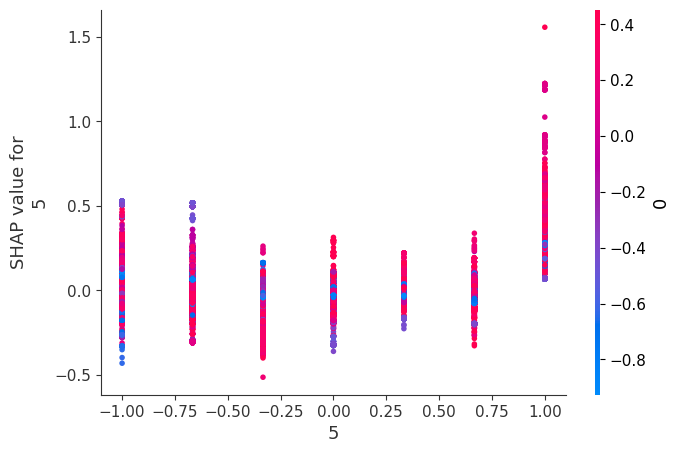

Generating SHAP dependence plot for feature 6...


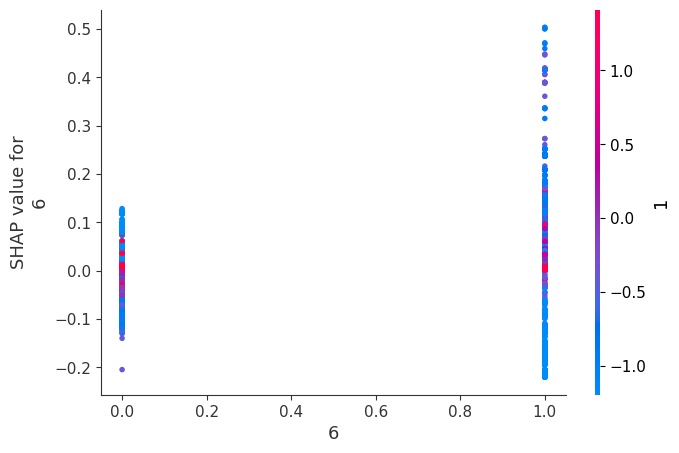

Generating SHAP waterfall plot for instance 0...


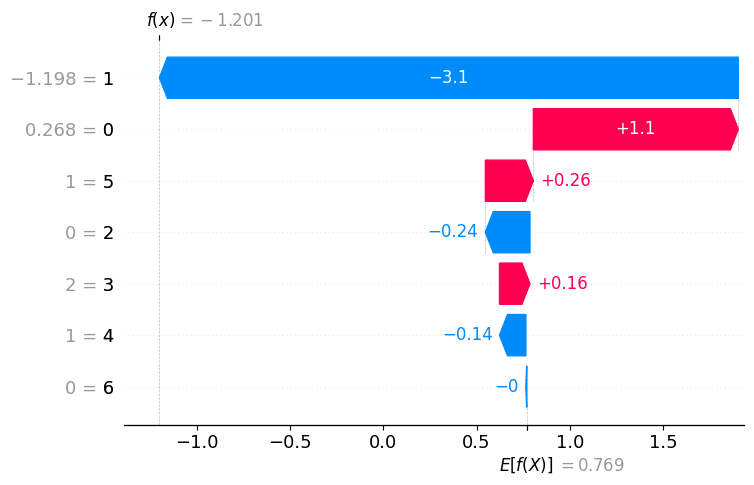

In [79]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Initialize SHAP explainer for the XGBoost model
explainer = shap.TreeExplainer(xgb_model)

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# If shap_values is a list (multi-output case), take the first class
if isinstance(shap_values, list):
    shap_values = shap_values[0]

# 1. SHAP Summary Plot (Global Feature Importance)
print("Generating SHAP summary plot (global feature importance)...")
shap.summary_plot(shap_values, X_test)
plt.show()

# 2. SHAP Summary Plot (Bar Chart for Global Feature Importance)
print("Generating SHAP bar chart...")
shap.summary_plot(shap_values, X_test, plot_type="bar")
plt.show()

# 3. SHAP Dependence Plot for each feature
# Loop through all features and generate a dependence plot for each feature
for feature in X_test.columns:
    print(f"Generating SHAP dependence plot for feature {feature}...")
    shap.dependence_plot(feature, shap_values, X_test)
    plt.show()

# 4. SHAP Waterfall Plot (Local Feature Importance for a Single Instance)
instance_index = 0  # Analyze the first instance in the test set (change as needed)
print(f"Generating SHAP waterfall plot for instance {instance_index}...")

# For a single instance, wrap the SHAP values in a shap.Explanation object
# Ensure to use the correct base value if it's a multi-output model
base_value = explainer.expected_value[0] if isinstance(explainer.expected_value, list) else explainer.expected_value

# Make sure to convert the features into a list of strings for correct formatting
feature_names = [str(col) for col in X_test.columns]

shap_values_instance = shap.Explanation(values=shap_values[instance_index], 
                                        base_values=base_value, 
                                        data=X_test.iloc[instance_index], 
                                        feature_names=feature_names)

# Now plot the waterfall plot for this specific instance
shap.waterfall_plot(shap_values_instance)
plt.show()

 
 


Class names: [0 1 2 3 4]


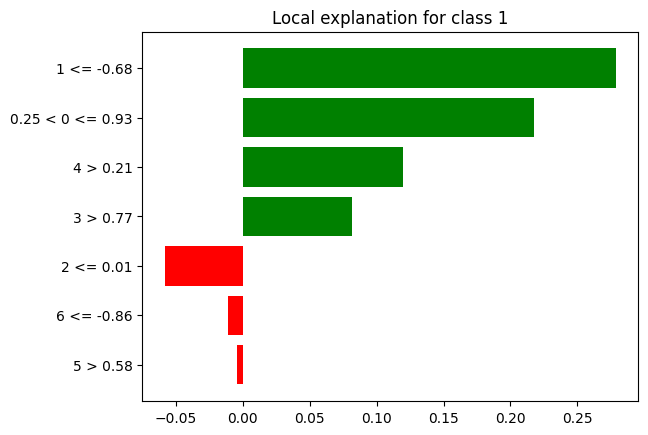

In [80]:
import lime
import lime.lime_tabular
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# Assuming X_train, X_test, and xgb_model are already defined
# X_train, X_test should be in the original feature space (not scaled)

# Choose a specific instance to explain
instance_index = 0  # Change this to any index for a different instance to explain

# Scale the data for LIME (this is important for LIME performance)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Dynamically find class names from the model
# Assuming it's a classification model with a 'classes_' attribute (common in scikit-learn or XGBoost models)
if hasattr(xgb_model, 'classes_'):
    class_names = xgb_model.classes_
elif hasattr(xgb_model, 'get_booster'):
    # For XGBoost model, get class names if it's a multi-class classification task
    class_names = xgb_model.get_booster().get_dump()[0].splitlines()[0].split()[0]
    class_names = [class_names]  # For binary classification, we usually have 2 classes
else:
    # If the model doesn't have a 'classes_' attribute, assume binary or multi-class classes
    class_names = ['Class 0', 'Class 1']  # Modify this if needed for multi-class problems

print(f"Class names: {class_names}")

# Create LIME Explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,  # The training data
    feature_names=X_test.columns,  # Column names for the features
    class_names=class_names,  # Dynamically assigned class names
    discretize_continuous=True  # Discretize continuous variables for better interpretability
)

# Generate LIME explanation for the instance
lime_explanation = lime_explainer.explain_instance(
    X_test_scaled[instance_index],  # The instance to explain
    xgb_model.predict_proba,  # The model's prediction function
    num_features=10  # Limit to top 10 features (you can change this number)
)

# Visualize the explanation in the notebook
lime_explanation.show_in_notebook()

# Alternatively, display it as a plot
fig = lime_explanation.as_pyplot_figure()
plt.show()


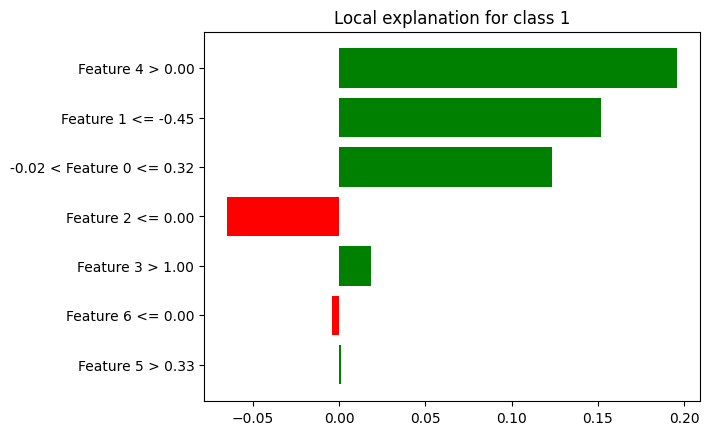

Prediction for this instance: 2 - Medium
Predicted class probabilities: [1.4909679e-03 9.9850684e-01 1.6668422e-06 1.1620902e-07 4.3072018e-07]

Feature Contributions:
Feature: Feature 4 > 0.00 | Contribution to Prediction: 0.5265

Interpretation of Contributions:
Feature 'Feature 4 > 0.00' contributed positively to the model's prediction. It indicates that a higher value of Feature 4 > 0.00 at 1.0 leads to a stronger likelihood of classifying this instance into the predicted class.
Feature 'Feature 4 > 0.00' has a value of 1.0, and its contribution is positive with a weight of 0.5265.

Top 5 Most Important Features for this Prediction:
Feature: F | Contribution: 0.1961
Feature: F | Contribution: 0.1520
Feature: - | Contribution: 0.1235
Feature: F | Contribution: -0.0652
Feature: F | Contribution: 0.0186


In [90]:
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Encode the categorical labels to numerical values
label_encoder = LabelEncoder()

# Assuming y_train is the target variable (with categorical string labels)
y_train_encoded = label_encoder.fit_transform(y_train)

# Fit the model using the encoded labels
model = XGBClassifier()
model.fit(X_train, y_train_encoded)

# Initialize the LIME Explainer for tabular data
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,  # Pass numpy array or pandas DataFrame
    feature_names=X_train.columns if hasattr(X_train, 'columns') else [f"Feature {i}" for i in range(X_train.shape[1])],  # Handle DataFrame or ndarray
    class_names=[str(i) for i in range(len(label_encoder.classes_))],  # Class names (encoded)
    mode="classification",  # Classification mode
    discretize_continuous=True  # Discretize continuous features
)

# Select a specific instance for explanation (e.g., the first instance in the test set)
instance_index = 0
exp = explainer.explain_instance(
    X_test[instance_index] if isinstance(X_test, np.ndarray) else X_test.iloc[instance_index],  # Handle both ndarray and DataFrame
    model.predict_proba,  # Predict probabilities using the trained model
    num_features=10  # Top features for explanation
)

# Show explanation in the notebook
exp.show_in_notebook(show_table=True, show_all=False)

# Visualize the explanation as a bar chart
exp.as_pyplot_figure()
plt.show()

# In-depth interpretation of the explanation
print(f"Prediction for this instance: {label_encoder.inverse_transform([model.predict([X_test.iloc[instance_index]])[0]])[0]}")
print(f"Predicted class probabilities: {model.predict_proba([X_test.iloc[instance_index]])[0]}")

# Detailed feature-wise interpretation
print("\nFeature Contributions:")
for feature, weight in zip(exp.as_list(), exp.local_pred):
    print(f"Feature: {feature[0]} | Contribution to Prediction: {weight:.4f}")

# Understanding the Significance of Each Feature
print("\nInterpretation of Contributions:")
for feature, weight in zip(exp.as_list(), exp.local_pred):
    feature_name = feature[0]
    
    # Extract the feature index (only the numeric part) from the feature name
    if isinstance(X_test, np.ndarray):
        # For ndarray format, extract the feature index by splitting the name
        feature_index = int(feature_name.split()[1])  # Extract numeric part after "Feature"
        feature_value = X_test[instance_index, feature_index]
    else:
        # For DataFrame format, use the index to get the feature value
        feature_index = int(feature_name.split()[1])  # Extract numeric part after "Feature"
        feature_value = X_test.iloc[instance_index, feature_index]

    if weight > 0:
        print(f"Feature '{feature_name}' contributed positively to the model's prediction. It indicates that a higher value of {feature_name} at {feature_value} leads to a stronger likelihood of classifying this instance into the predicted class.")
    else:
        print(f"Feature '{feature_name}' contributed negatively to the model's prediction. It suggests that a higher value of {feature_name} at {feature_value} works against classifying this instance into the predicted class.")
    
    if isinstance(feature_value, (int, float)):
        print(f"Feature '{feature_name}' has a value of {feature_value}, and its contribution is {'positive' if weight > 0 else 'negative'} with a weight of {weight:.4f}.")
    else:
        print(f"Categorical feature '{feature_name}' (value: {feature_value}) has a weight of {weight:.4f}.")

# Top 5 Most Important Features
print("\nTop 5 Most Important Features for this Prediction:")
top_features = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)[:5]
for feature, weight in top_features:
    print(f"Feature: {feature[0]} | Contribution: {weight:.4f}")


In [101]:
import pandas as pd

# Convert X_train to DataFrame (if it's a NumPy array)
X_train_df = pd.DataFrame(X_train, columns=["Feature_" + str(i) for i in range(X_train.shape[1])])

# Initialize LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_df.values,  # Use values as the training data
    feature_names=X_train_df.columns.tolist(),  # Feature names from DataFrame
    class_names=label_encoder.classes_.tolist(),  # Class names from label encoder
    mode="classification",  # Since this is a classification task
    discretize_continuous=True  # Discretize continuous features
)

# Continue with explanation and visualization as before
instance_index = 0
instance = X_test.iloc[instance_index].values.reshape(1, -1)

exp = explainer.explain_instance(
    instance[0],  # The instance to explain
    xgb_model.predict_proba,  # Use the model's predict_proba method for probabilities
    num_features=10  # Number of top features to show in explanation
)

exp.show_in_notebook(show_table=True, show_all=False)


 

### 1. **Prediction Probabilities**:
   - The left side shows the **predicted class probabilities** for each class. In this case, it predicts the class "2 - Medium" with a probability of **1.00**, meaning it's 100% confident that this instance belongs to the "Medium" class.
   - Other classes, such as "1 - High", "3 - Low", "BACnet", and "CPMS", have a probability of **0.00**, indicating that the model is not assigning any likelihood to these classes for this particular instance.

### 2. **Feature Contributions**:
   - On the right side, we have a **bar chart** that shows how each feature (Feature 0, Feature 1, Feature 2, etc.) influences the prediction.
   - The **"orange bars"** represent **positive contributions** to the predicted class ("2 - Medium"), and **"green bars"** show **negative contributions** to the prediction.
   
### Feature Breakdown:
- **Feature 4** contributes **1.00** (positive effect), pushing the prediction towards "2 - Medium".
- **Feature 1** has a **negative effect** of **-1.20**, which pulls the prediction away from "2 - Medium".
- **Feature 0** has a **positive effect** of **0.27**, pushing the prediction towards "2 - Medium".
- **Feature 2** contributes **0.00**, meaning it has no influence on the prediction.
- **Feature 3** contributes **2.00**, a **strong positive effect** on the "2 - Medium" prediction.
- **Feature 5** contributes **1.00**, which further supports the prediction of "2 - Medium".
- **Feature 6** contributes **0.00**, indicating no influence on the prediction.

### Feature Thresholds:
Some features have **threshold values** such as `Feature_2 <= 0.00`, which means the explanation is showing the effect when `Feature_2` is less than or equal to `0.00`.

### Final Prediction:
- The model predicts "2 - Medium" with high confidence (probability = 1.00), and the contribution of each feature is shown, helping us understand which features most influenced this decision and how (either positively or negatively).

In summary, uss visualization helps you understand the **local prediction** for a specific instance by showing the relative importance and contribution of each feature to the predicted class, "2 - Medium".

Explanation for Instance 0:


Prediction probabilities for Instance 0: [[1.4909679e-03 9.9850684e-01 1.6668422e-06 1.1620902e-07 4.3072018e-07]]



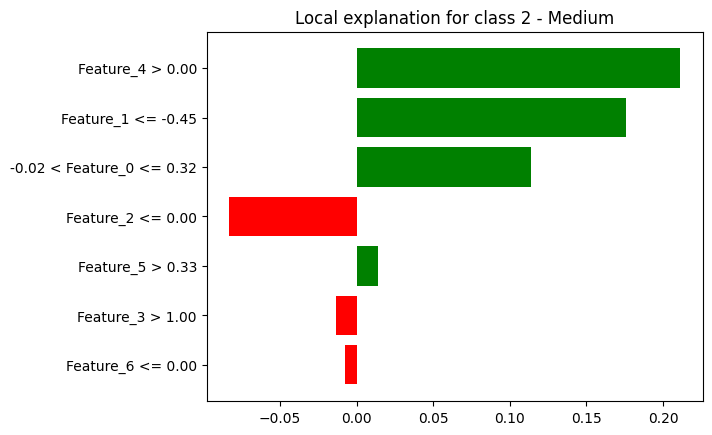

Local Explanation (Feature Contributions):
Feature: Feature_4 > 0.00 - Contribution: 0.5287


Explanation for Instance 1:


Prediction probabilities for Instance 1: [[6.0658500e-04 9.9938941e-01 2.1372703e-06 4.0070361e-07 1.4504201e-06]]



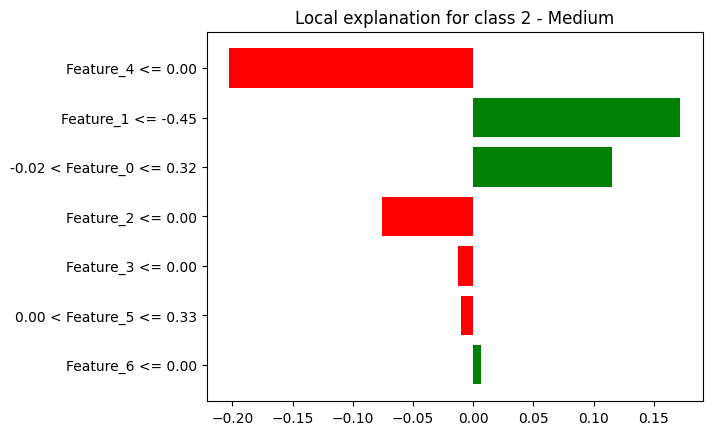

Local Explanation (Feature Contributions):
Feature: Feature_4 <= 0.00 - Contribution: 0.3176


Explanation for Instance 2:


Prediction probabilities for Instance 2: [[8.9110772e-06 1.5693468e-05 9.9997461e-01 4.8174479e-07 2.8126308e-07]]



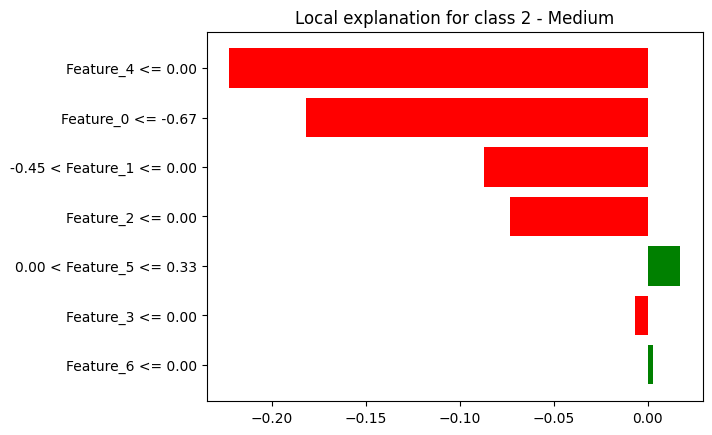

Local Explanation (Feature Contributions):
Feature: Feature_4 <= 0.00 - Contribution: -0.0833




In [104]:
import pandas as pd
import lime.lime_tabular
import matplotlib.pyplot as plt

# Convert X_train to DataFrame (if it's a NumPy array)
X_train_df = pd.DataFrame(X_train, columns=["Feature_" + str(i) for i in range(X_train.shape[1])])

# Initialize LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_df.values,  # Use values as the training data
    feature_names=X_train_df.columns.tolist(),  # Feature names from DataFrame
    class_names=label_encoder.classes_.tolist(),  # Class names from label encoder
    mode="classification",  # Since this is a classification task
    discretize_continuous=True  # Discretize continuous features
)

# Step 1: Loop through 3 instances from the test set
for instance_index in range(3):  # Change the range as needed
    instance = X_test.iloc[instance_index].values.reshape(1, -1)

    # Step 2: Generate LIME explanation for the current instance
    exp = explainer.explain_instance(
        instance[0],  # The instance to explain
        xgb_model.predict_proba,  # Use the model's predict_proba method for probabilities
        num_features=10  # Number of top features to show in explanation
    )

    # Step 3: Show the explanation in the notebook
    print(f"Explanation for Instance {instance_index}:")

    # Show the table with the features and their contributions
    exp.show_in_notebook(show_table=True, show_all=False)

    # Step 4: Show the local prediction probabilities
    pred_probs = xgb_model.predict_proba(instance)  # Prediction probabilities for the instance
    print(f"Prediction probabilities for Instance {instance_index}: {pred_probs}\n")

    # Step 5: Show feature contributions visually
    fig = exp.as_pyplot_figure()  # Get the figure for LIME's feature importance plot
    plt.show()

    # Optional: Show more detailed local explanation information
    print("Local Explanation (Feature Contributions):")
    for feature, weight in zip(exp.as_list(), exp.local_pred):
        print(f"Feature: {feature[0]} - Contribution: {weight:.4f}")
    print("\n" + "="*50 + "\n")


In [108]:

# Print unique classes in the training target variable
unique_classes_train = y_train.unique()
print(f"Unique classes in y_train: {unique_classes_train}")

# If you have the test set (y_test) and want to see the unique classes there as well
unique_classes_test = y_test.unique()
print(f"Unique classes in y_test: {unique_classes_test}")


Unique classes in y_train: ['CPMS', 'BACnet', '2 - Medium', '1 - High', '3 - Low']
Categories (6, object): ['1 - High', '2 - Medium', '3 - Low', 'BACnet', 'CPMS', 'Central Battery System-Medium']
Unique classes in y_test: ['2 - Medium', '3 - Low', 'BACnet', '1 - High', 'CPMS']
Categories (6, object): ['1 - High', '2 - Medium', '3 - Low', 'BACnet', 'CPMS', 'Central Battery System-Medium']


In [109]:
# Print unique classes in the training target variable
unique_classes_train = y_train.unique()
print(f"Unique classes in y_train: {unique_classes_train}")

# If you have the test set (y_test) and want to see the unique classes there as well
unique_classes_test = y_test.unique()
print(f"Unique classes in y_test: {unique_classes_test}")


Unique classes in y_train: ['CPMS', 'BACnet', '2 - Medium', '1 - High', '3 - Low']
Categories (6, object): ['1 - High', '2 - Medium', '3 - Low', 'BACnet', 'CPMS', 'Central Battery System-Medium']
Unique classes in y_test: ['2 - Medium', '3 - Low', 'BACnet', '1 - High', 'CPMS']
Categories (6, object): ['1 - High', '2 - Medium', '3 - Low', 'BACnet', 'CPMS', 'Central Battery System-Medium']
